# The stability of the global average on different window lengths
This notebook outllines different methods that can be used to de-trend the LongRunMIP and ZECMIP time series.

 <h1 style='color: yellow'> Imports</h1>

In [1]:
# Standard Library Imports
import os
import sys
from typing import List, Any, Callable, Union, Tuple, Optional
from importlib import reload
from time import sleep
from time import time as time_it
# Third-Party Library Imports
import numpy as np
import pandas as pd
import dask
import xarray as xr
# import climtas
from typing import NamedTuple
from enum import Enum
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MaxNLocator
import cartopy.crs as ccrs
from functools import partial
from glob import glob
import cftime
import string
from numpy.typing import ArrayLike
# Custom Module Imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'zecmip_stabilisation'))
import constants
sys.path.append(constants.MODULE_DIR)
import open_zecmip
import utils
# import signal_to_noise as sn
import plotting_functions
import xarray_extender as xe
import zec_calculation_functions
import signal_to_noise_calculations as sn_calc

import my_stats

# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=RuntimeWarning, module='dask.*')
warnings.filterwarnings("ignore", category=Warning)
# # Logging
# logger = utils.get_notebook_logger()

Matplotlib created a temporary cache directory at /jobfs/132684167.gadi-pbs/matplotlib-2t1tz29b because the default path (/home/563/ab2313/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Matplotlib is building the font cache; this may take a moment.


In [2]:
from scipy.stats import spearmanr
from matplotlib.colors import BoundaryNorm
from scipy.stats import linregress
from matplotlib import ticker as mticker
import pymannkendall as mk

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from sklearn.metrics import r2_score
import scipy.stats as stats
import seaborn as sns
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from matplotlib.colors import BoundaryNorm, LinearSegmentedColormap
from scipy import stats

In [3]:
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'list_xarray'))
from listXarray import listXarray, where, apply_ufunc, read_listxarray

In [4]:
np.set_printoptions(precision=2, suppress=True, edgeitems=1)
xr.set_options(display_expand_data=False)

In [279]:
client.close()

- Closing Nanny at 'tcp://127.0.0.1:41501'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:40383'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:46175'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:34623'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:43149'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:33437'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:44877'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:43071'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:45143'. Reason: nanny-close
- Nanny 

2025-01-22 10:14:18,507 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/worker.py", line 1250, in heartbeat
    response = await retry_operation(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/utils_comm.py", line 459, in retry_operation
    return await retry(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/utils_comm.py", line 438, in retry


- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:34349'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:41381'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:39555'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:37791'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:34203'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:36235'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:42903'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:35225'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at '

2025-01-22 10:14:18,818 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/worker.py", line 1250, in heartbeat
    response = await retry_operation(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/utils_comm.py", line 459, in retry_operation
    return await retry(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/utils_comm.py", line 438, in retry


- Closing Nanny at 'tcp://127.0.0.1:40085'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:43407'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:33581'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:40447'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:34551'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:41693'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:33615'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:40953'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:46375'. Reason: nanny-close
- Nanny 

2025-01-22 10:14:19,064 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/worker.py", line 1250, in heartbeat
    response = await retry_operation(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/utils_comm.py", line 459, in retry_operation
    return await retry(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/utils_comm.py", line 438, in retry


In [5]:
from dask.distributed import Client
# client.close()
client = Client(memory_limit=None, threads_per_worker=1, n_workers=12)
client

- State start
-   Scheduler at:     tcp://127.0.0.1:37435
-   dashboard at:         /proxy/8787/status
- Registering Worker plugin shuffle
-         Start Nanny at: 'tcp://127.0.0.1:44389'
-         Start Nanny at: 'tcp://127.0.0.1:44983'
-         Start Nanny at: 'tcp://127.0.0.1:35951'
-         Start Nanny at: 'tcp://127.0.0.1:38729'
-         Start Nanny at: 'tcp://127.0.0.1:39827'
-         Start Nanny at: 'tcp://127.0.0.1:40869'
-         Start Nanny at: 'tcp://127.0.0.1:38683'
-         Start Nanny at: 'tcp://127.0.0.1:36105'
-         Start Nanny at: 'tcp://127.0.0.1:46787'
-         Start Nanny at: 'tcp://127.0.0.1:42069'
-         Start Nanny at: 'tcp://127.0.0.1:43961'
-         Start Nanny at: 'tcp://127.0.0.1:43865'
- Register worker <WorkerState 'tcp://127.0.0.1:42845', name: 4, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:42845
- Starting established connection to tcp://127.0.0.1:40626
- Register worker <WorkerState 'tcp://127

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 12
Total threads: 12,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37435,Workers: 12
Dashboard: /proxy/8787/status,Total threads: 12
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:33421,Total threads: 1
Dashboard: /proxy/36601/status,Memory: 0 B
Nanny: tcp://127.0.0.1:44389,


- Event loop was unresponsive in Nanny for 3.19s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.20s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.22s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.23s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.25s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.26s.  This is often caused by long-runni

<h1 style='color: yellow'> Opening Data </h1>

In [6]:
chunks = {'lat':-1, 'lon':-1, 'time':-1, 'ensemble':-1}

In [7]:
chunks_model_based = {
    'ACCESS-ESM1-5': {'time':-1, 'lat':int(145/4), 'lon':int(192/2)},   # too big
    'CESM2': {'time':-1, 'lat':int(145/4), 'lon':int(192/4)},
    'CanESM5': {'time':-1, 'lat':int(64/4), 'lon':int(128/4)},
    'GFDL-ESM4': {'time':-1, 'lat':int(180/3), 'lon':int(144/4)},
    'GISS-E2-1-G-CC': {'time':-1, 'lat':int(90/2), 'lon':int(192/4)},
    'MIROC-ES2L': {'time':-1, 'lat':int(64/2), 'lon':int(128/2)},
    'MPI-ESM1-2-LR': {'time':-1, 'lat':int(96/2), 'lon':int(192/2)},
    'NorESM2-LM': {'time':-1, 'lat':int(96/2), 'lon':int(144/4)},
    'UKESM1-0-LL': {'lat':int(144/8), 'lon':int(192/3), 'time':-1},
}

In [8]:
# chunks_model_based = {
#     'ACCESS-ESM1-5': {'time':-1, 'lat':int(145/4), 'lon':int(192/2)},   # too big
#     'CESM2': {'time':-1, 'lat':int(145/4), 'lon':int(192/4)},
#     'CanESM5': {'time':-1, 'lat':int(64/4), 'lon':int(128/4)},
#     'GFDL-ESM4': {'time':-1, 'lat':int(180/3), 'lon':int(144/4)},
#     'GISS-E2-1-G-CC': {'time':-1, 'lat':int(90/2), 'lon':int(192/4)},
#     'MIROC-ES2L': {'time':-1, 'lat':int(64/2), 'lon':int(128/2)},
#     'MPI-ESM1-2-LR': {'time':-1, 'lat':int(96/2), 'lon':int(192/2)},
#     'NorESM2-LM': {'time':-1, 'lat':int(96/2), 'lon':int(144/4)},
#     'UKESM1-0-LL': {'lat':int(144/8), 'lon':int(192/3), 'time':-1},
# }

In [9]:
a1_raw_data = (open_zecmip.extract_experiment_into_xrlist(
    '1000pgc', 'tas', chunks=chunks, logginglevel='ERROR')
                 .to_dataarray('tas')
                 .sort_by_refkey())#.merge_dim_to_refkey('ensemble')

In [10]:
a1_raw_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'ensemble': 1, 'model': 1, 'time': 1212, 'lat': 145, 'lon': 192})
              (Array: 128.72, Chunk: 128.72Mib) ({'ensemble': (1,), 'model': (1,), 'time': (1212,), 'lat': (145,), 'lon': (192,)})
CESM2          (dataArray): ({'ensemble': 1, 'model': 1, 'time': 1800, 'lat': 192, 'lon': 288})
              (Array: 379.69, Chunk: 126.56Mib) ({'ensemble': (1,), 'model': (1,), 'time': (600, 600, 600), 'lat': (192,), 'lon': (288,)})
CanESM5        (dataArray): ({'ensemble': 5, 'model': 1, 'time': 1200, 'lat': 64, 'lon': 128})
              (Array: 187.50, Chunk: 37.5Mib) ({'ensemble': (1, 1, 1, 1, 1), 'model': (1,), 'time': (1200,), 'lat': (64,), 'lon': (128,)})
GFDL-ESM4      (dataArray): ({'ensemble': 1, 'model': 1, 'time': 2400, 'lat': 180, 'lon': 288})
              (Array: 474.61, Chunk: 237.3Mib) ({'ensemble': (1,), 'model': (1,), 'time': (1200, 1200), 'lat': (180,), 'lon': (288,)})
GISS-E2-1-G-CC (dataArray): ({'ensembl

In [11]:
pct_raw_data =  (open_zecmip.extract_experiment_into_xrlist(
    '1pct', 'tas', chunks=chunks, logginglevel='INFO')
                   .to_dataarray('tas')
                   .sort_by_refkey())

- ACCESS-ESM1-5
-      r1i1p1f1 - /g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/1pctCO2/r1i1p1f1/Amon/tas/gn/v20191115/*.nc
- CanESM5
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/1pctCO2/r1i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r1i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/1pctCO2/r1i1p2f1/Amon/tas/gn/v20190429/*.nc
-      r2i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/1pctCO2/r2i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r2i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/1pctCO2/r2i1p2f1/Amon/tas/gn/v20190429/*.nc
-      r3i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/1pctCO2/r3i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r3i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/1pctCO2/r3i1p2f1/Amon/tas/gn/v20190429/*.nc
- MIROC-ES2L
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MIROC/MIROC-ES2L/1pctCO2/r1i1p1f2/Amon/tas/gn/v20190823/*.nc
- UKESM1-0-LL
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MOHC/UKESM1

In [12]:
# Making sure that the ensembles match. NOTE -  this can not be done
# with the piControl
a1_raw_data = a1_raw_data.cross_match_dim(pct_raw_data, 'ensemble')
pct_raw_data = pct_raw_data.cross_match_dim(a1_raw_data, 'ensemble')

In [13]:
# Single esemble extraction
a1_raw_data = a1_raw_data.isel(ensemble=0)
pct_raw_data = pct_raw_data.isel(ensemble=0)

In [14]:
# Convert to celcius
a1_raw_data = a1_raw_data - 273.15
pct_raw_data = pct_raw_data - 273.15

In [15]:
# Can remove a lot of data, as I don't actually need this past the 70 year mark
# Data is montly so times by 12, a do 100 points just for saftery
# 100 years times months in year
pct_raw_data = pct_raw_data.isel(time=slice(0, 100 * 12))

In [16]:
# Yearly data transfomration - montly resolution is not needed
pct_data = pct_raw_data.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
a1_full_data = a1_raw_data.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')

In [17]:
# Reduce time so that the smalles time densions matches. This is at 101 years
a1_data = a1_full_data#@.isel(time=slice(None, 100))

In [18]:
# This improves vectorization having time (vector dimension) in -1 position
dim_order = ['model', 'lat', 'lon', 'time']

In [19]:
a1_full_data = a1_full_data.transpose(*dim_order).compute().chunk({'time':-1})#.chunk(chunks_model_based)

In [20]:
a1_data = a1_data.compute().transpose(*dim_order)#.chunk(chunks_model_based)

In [21]:
a1_full_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192, 'time': 101})
              (Array: 10.73, Chunk: 10.73Mib) ({'model': (1,), 'lat': (145,), 'lon': (192,), 'time': (101,)})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288, 'time': 150})
              (Array: 31.64, Chunk: 31.64Mib) ({'model': (1,), 'lat': (192,), 'lon': (288,), 'time': (150,)})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 100})
              (Array: 3.12, Chunk: 3.12Mib) ({'model': (1,), 'lat': (64,), 'lon': (128,), 'time': (100,)})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288, 'time': 200})
              (Array: 39.55, Chunk: 39.55Mib) ({'model': (1,), 'lat': (180,), 'lon': (288,), 'time': (200,)})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144, 'time': 180})
              (Array: 8.90, Chunk: 8.9Mib) ({'model': (1,), 'lat': (90,), 'lon': (144,), 'time': (180,)})
MIROC-ES2L     (dataArra

In [22]:
a1_full_data[3]

<xarray.DataArray 'tas' (model: 1, lat: 180, lon: 288, time: 200)> Size: 41MB
dask.array<chunksize=(1, 180, 288, 200), meta=np.ndarray>
Coordinates:
  * lat       (lat) float64 1kB -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon       (lon) float64 2kB 0.625 1.875 3.125 4.375 ... 356.9 358.1 359.4
  * model     (model) <U9 36B 'GFDL-ESM4'
    ensemble  <U8 32B 'r1i1p1f1'
  * time      (time) object 2kB 0064-12-31 00:00:00 ... 0263-12-31 00:00:00

<h1 style='color: yellow'> GMST Calculations </h1>

<h2 style='color:cyan'>  Space Mean </h2>

In [23]:
# Space mean calculations
a1_smean_data = a1_data(my_stats.space_mean).compute()
pct_smean_data = pct_data(my_stats.space_mean).compute()

In [24]:
a1_full_smean_data = a1_full_data.apply(my_stats.space_mean).compute()

model


In [25]:
pct_smean_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'time': 100})
CESM2          (dataArray): ({'model': 1, 'time': 100})
CanESM5        (dataArray): ({'model': 1, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'time': 100})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'time': 100})
MIROC-ES2L     (dataArray): ({'model': 1, 'time': 100})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'time': 100})
NorESM2-LM     (dataArray): ({'model': 1, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'time': 100})

In [26]:
a1_smean_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'time': 330})

In [27]:
# Get the data fror each branch point
branch_point_smean_data = pct_smean_data(
    zec_calculation_functions.isolate_base_period,
    a1_smean_data, logginglevel='INFO')

- <function isolate_base_period at 0x14e3ee230940> has been called
- ACCESS-ESM1-5


In [28]:
branch_point_smean_data.isel(time=slice(0,10))

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'time': 10})
CESM2          (dataArray): ({'model': 1, 'time': 10})
CanESM5        (dataArray): ({'model': 1, 'time': 10})
GFDL-ESM4      (dataArray): ({'model': 1, 'time': 10})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'time': 10})
MIROC-ES2L     (dataArray): ({'model': 1, 'time': 10})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'time': 10})
NorESM2-LM     (dataArray): ({'model': 1, 'time': 10})
UKESM1-0-LL    (dataArray): ({'model': 1, 'time': 10})

In [29]:
# The base period average
branch_point_mean_smean_data = branch_point_smean_data.mean(dim='time')

In [30]:
# Anomalies by subracting the base period
a1_smean_anom_data = a1_smean_data - branch_point_mean_smean_data

In [31]:
a1_full_smean_data = a1_full_data.apply(my_stats.space_mean).compute()

model


In [32]:
branch_point_smean_anom_data = branch_point_smean_data - branch_point_mean_smean_data

In [33]:
branch_point_smean_anom_t0_da = branch_point_smean_anom_data.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model')#.drop('ensemble', error='ignore')
a1_smean_anom_t0_da = a1_smean_anom_data.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model')#.drop('ensemble', error='ignore')

model
model


In [34]:
branch_point_smean_anom_t0_da['time'] = branch_point_smean_anom_t0_da.time.dt.year.values -10
a1_smean_anom_t0_da['time'] = a1_smean_anom_t0_da.time.dt.year.values

In [35]:
a1_pct_data = pct_smean_data(zec_calculation_functions.base_a1_merge, a1_smean_data)

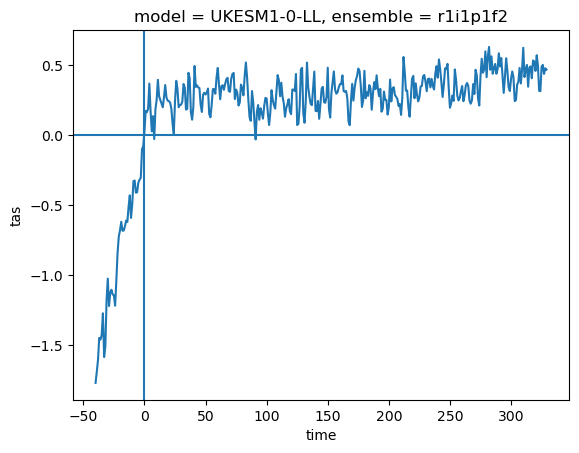

In [36]:
fig = plt.figure()
ax = fig.add_subplot(111)
(a1_pct_data[-1]-branch_point_mean_smean_data[-1].values.item()).plot()
ax.axvline(0)
ax.axhline(0)

In [37]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_smean_da = a1_smean_anom_data.isel(time=slice(15, 35)).mean(dim='time').concat('model')
zec50_smean_da = a1_smean_anom_data.isel(time=slice(40, 60)).mean(dim='time').concat('model')
zec90_smean_da = a1_smean_anom_data.isel(time=slice(80, 100)).mean(dim='time').concat('model')
zecfinal_smean_da = a1_smean_anom_data.isel(time=slice(-20, None)).mean(dim='time').concat('model')

In [38]:
def calculate_slope(y):
    # Assuming the regression is along the time dimension
    x = np.arange(len(y))
    slope, _, _, _, _ = linregress(x, y)
    return slope

In [39]:
def calculate_slope_and_line(y):
    # Assuming the regression is along the time dimension
    x = np.arange(len(y))
    slope, intercept, _, _, _ = linregress(x, y)
    
    # Calculate the fitted line
    fitted_line = slope * x + intercept
    
    return slope, fitted_line

<h2 style='color:cyan'> Hodrick-Prescot (HP filter) and LOWESS </h2>

In [40]:
import statsmodels.api as sm
import patsy

In [41]:
imodel = -1#'UKESM1-0-LL'
model = a1_full_smean_data.model[imodel]
model

'UKESM1-0-LL'

In [42]:
lowess_1_gm_data = a1_full_smean_data(my_stats.trend_fit, method='lowess', lowess_window=21).compute()
lowess_2_gm_data = a1_full_smean_data(my_stats.trend_fit, method='lowess', lowess_window=41).compute()
lowess_3_gm_data = a1_full_smean_data(my_stats.trend_fit, method='lowess', lowess_window=61).compute()
lowess_4_gm_data = a1_full_smean_data(my_stats.trend_fit, method='lowess', lowess_window=81).compute()
lowess_5_gm_data = a1_full_smean_data(my_stats.trend_fit, method='lowess', lowess_window=99).compute()

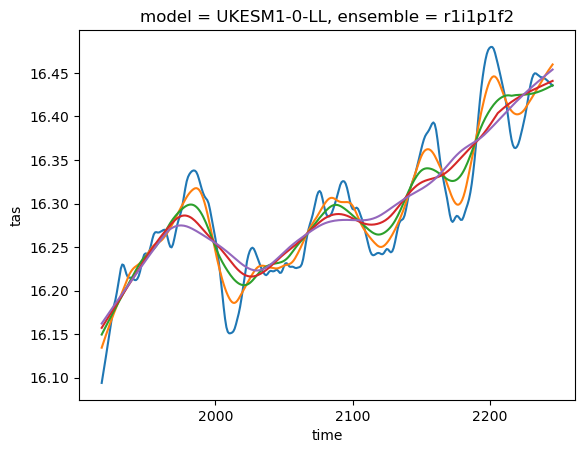

In [43]:
lowess_1_gm_data[model].plot()
lowess_2_gm_data[model].plot()
lowess_3_gm_data[model].plot()
lowess_4_gm_data[model].plot()
lowess_5_gm_data[model].plot()

In [44]:
temperatures = a1_full_smean_data[model].squeeze().dropna(dim='time').values
#a1_smean_anom_data[-1].squeeze().values
temperatures.shape

(330,)

In [45]:
cyclical, hp_trend = sm.tsa.filters.hpfilter(temperatures, lamb=1600) 

In [46]:
def calculate_hp_trend(da):
    
    da = da.dropna(dim='time')
    
    temperatures = da.squeeze().values

    # temperatures = temperatures[np.isfinite(temperatures)]
    cyclical, hp_trend = sm.tsa.filters.hpfilter(temperatures, lamb=1600) 

    da_trend = xr.zeros_like(da) + hp_trend
    return da_trend

In [47]:
hp_trend_data = a1_full_smean_data(calculate_hp_trend)

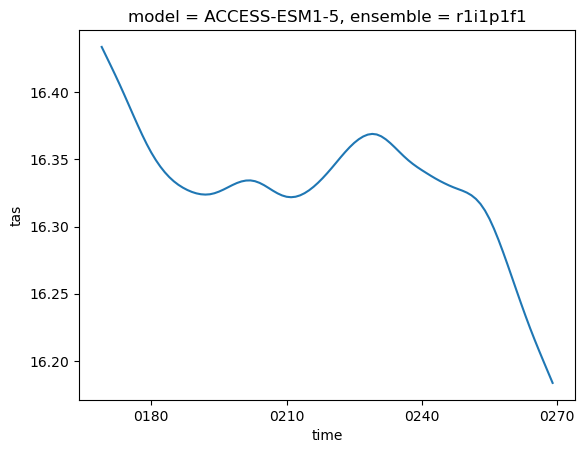

In [48]:
hp_trend_data[0].plot()

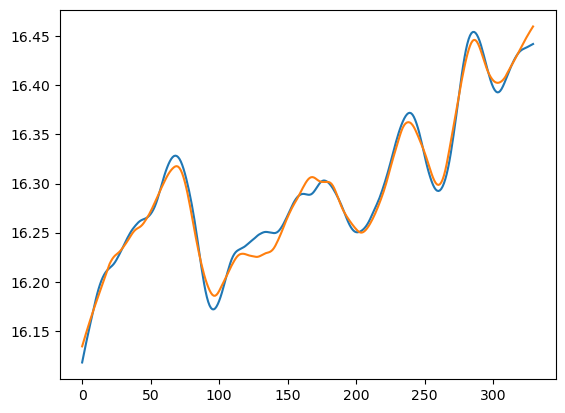

In [49]:
plt.plot(hp_trend)
plt.plot(lowess_2_gm_data[model].squeeze().values);

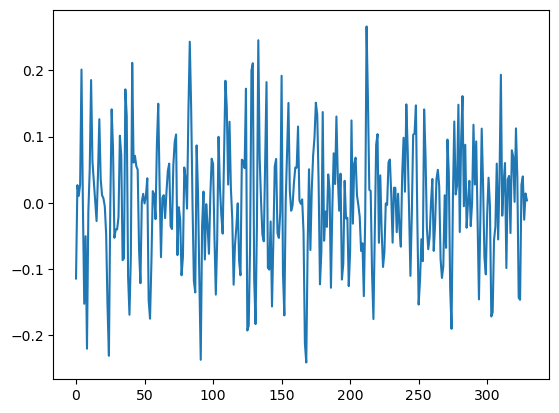

In [50]:
plt.plot(cyclical)

In [51]:
zec50_smean_da.sel(model=model).values.item()

0.2892118302627617

In [52]:
change_in_trend = hp_trend[50] - hp_trend[0]
change_in_trend

0.1510938314923962

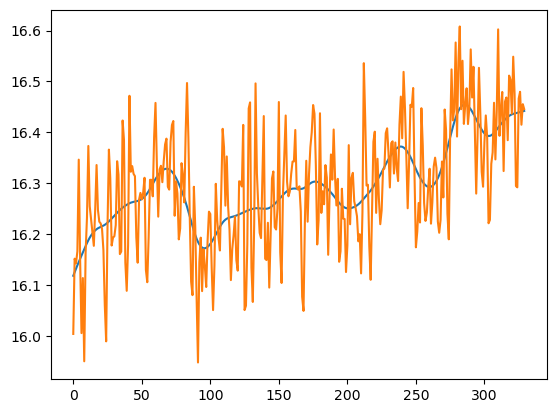

In [53]:
plt.plot(hp_trend)
plt.plot(temperatures)

<h2 style='color:cyan'>Linear Splines </h2>

In [54]:
# Example data
# years = np.array([1950, 1951, ..., 2020])  # Replace with actual years
years = np.arange(len(temperatures))
temperatures = temperatures#np.array([...])  # Replace with temperature data

# Define knot positions (e.g., every 20 years)
knots = years[::25]

# Create spline basis
spline_basis = patsy.dmatrix("bs(years, knots=knots, degree=1, include_intercept=True)", {"years": years})

# Fit the model
spline_model = sm.OLS(temperatures, spline_basis)
results = spline_model.fit()

# Get predicted values
predicted_temperatures = results.predict(spline_basis)

In [55]:
# Define knot positions (e.g., every 25 years)
knots = years[::25]

# Calculate midpoints
midpoints = (knots[:-1] + knots[1:]) / 2

# Initialize gradients array
gradients = np.zeros(len(midpoints))

# Calculate gradients at midpoints
for i, midpoint in enumerate(midpoints):
    idx = np.argmin(np.abs(years - midpoint))
    dy = years[1] - years[0]  # Assuming uniform spacing
    gradients[i] = (predicted_temperatures[idx + 1] - predicted_temperatures[idx - 1]) / (2 * dy)

In [56]:
tc1 = gradients[0]*25
tc2 = gradients[1]*25

In [57]:
tc1 + tc2

0.1370780569706298

In [58]:
zec50_smean_da.sel(model=model).values.item()

0.2892118302627617

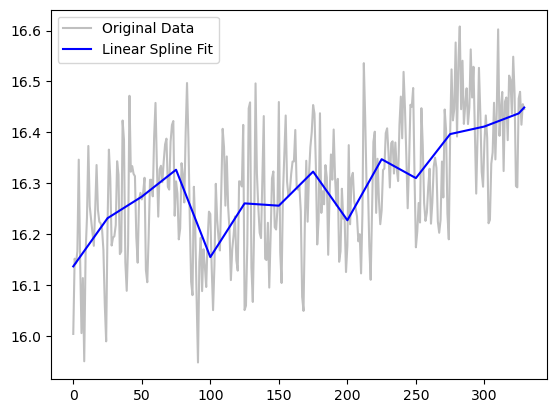

In [59]:
# Plot results
plt.plot(years, temperatures, label="Original Data", color='gray', alpha=0.5)
plt.plot(years, predicted_temperatures, label="Linear Spline Fit", color='blue')
plt.legend()

In [60]:
def calcuilate_splines(da):

    da = da.dropna(dim='time')
    
    temperatures = da.squeeze().values
    # Example data
    # years = np.array([1950, 1951, ..., 2020])  # Replace with actual years
    years = np.arange(len(temperatures))
    temperatures = temperatures#np.array([...])  # Replace with temperature data
    
    # Define knot positions (e.g., every 20 years)
    knots = years[::25]
    
    # Create spline basis
    spline_basis = patsy.dmatrix("bs(years, knots=knots, degree=1, include_intercept=True)", {"years": years})
    
    # Fit the model
    spline_model = sm.OLS(temperatures, spline_basis)
    results = spline_model.fit()
    
    # Get predicted values
    predicted_temperatures = results.predict(spline_basis)
    da_trend = xr.zeros_like(da) + predicted_temperatures

    return da_trend

In [61]:
linear_spline_data = a1_full_smean_data(calcuilate_splines)

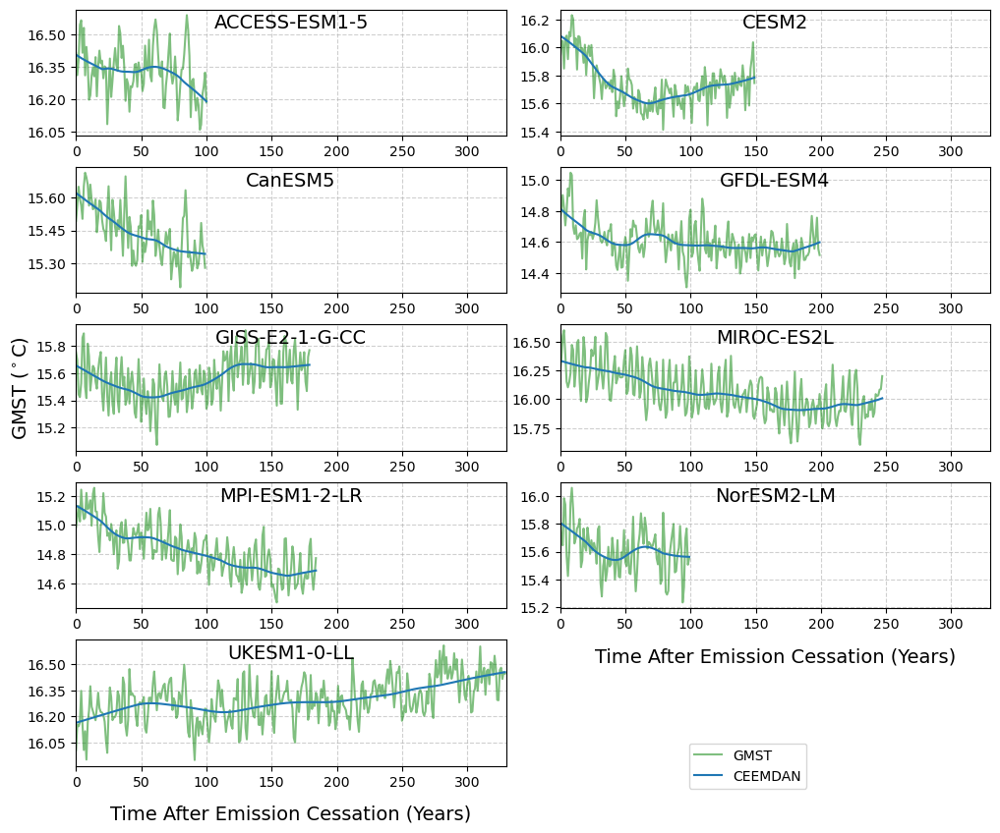

In [62]:
models = pct_smean_data.model

ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.25, wspace=0.125)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    ax = axes[num]
    time = np.arange(a1_full_smean_data[model].time.shape[0])
    a1_raw_vals = a1_full_smean_data[model].squeeze().values
    
    # potential_series_vals = potential_series_data[model].squeeze().values
    
    # Plot the data for each model
    ax.plot(time, a1_raw_vals , color='green', label='GMST', alpha=0.5)
    # ax.plot(time, potential_series_vals, label='CEEMDAN')

    if 'UKESM' in model:
        vals = lowess_5_gm_data[model].squeeze().values
    else:
        vals = lowess_2_gm_data[model].squeeze().values
    ax.plot(time,vals , label='CEEMDAN');
    # ax.plot(time, hp_trend_data[model].squeeze().values, label='CEEMDAN', color='brown');
    
    # ax.plot(time, linear_spline_data[model].squeeze().values, label='Linear Splines', color='red');
    # ax.plot(time, hp_trend, label='Hodrick-Prescot');

    
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_title('')
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))



    if num == int(len(models)/2):  axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    else:  ax.set_ylabel('')

    # ax.set_xlim(np.take(time, [0, -1]))
    # ax.set_xlim(np.take(time, [0, -1]))
    ax.set_xlim(0, 330)
    # plotting_functions.add_figure_label2(ax, f'{chr(97+num)})', y=.87)
    # ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[-1]+0.05)
    # ax.set_ylim(-0.7, 0.7)
    # ax.axhline(0, color='k', linewidth=.5)
    

    # if num in [0, 1]: 
    #     axes[num].xaxis.set_label_position('top')

# Add a legend in the lower left hand corner
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(0.75, 0.08))

# Labeling x-axis for specific subplots
for ax_num in [-1, -2]:
    ax = axes[ax_num]
    ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', 
                  fontsize=14, labelpad=25 if ax_num < 0 else 12)


<h2 style='color: cyan'> Ensemble Empirical Mode Decomposition </h2>

### Calculation of IMFS

In [63]:
from PyEMD import CEEMDAN

In [64]:
ceedman = CEEMDAN(trials=500)

In [65]:
def calculate_CEEMDAN(da):
    # Extract the signal and time from the input xarray.DataArray
    signal = da.values
    time = da.coords['time'].values  # Use the actual time values from the xarray
    
    # Initialize EMD

    # Perform the decomposition
    IMFs = ceedman(signal)

    # Create an xarray.DataArray directly from the IMFs
    IMF_da = xr.DataArray(IMFs, dims=["imf", "time"],
                          coords={"imf": np.arange(IMFs.shape[0]), "time": time})

    IMF_da.name = da.name

    return IMF_da

In [66]:
imf_data = a1_full_smean_data.dropna(dim='time').squeeze()(calculate_CEEMDAN, logginglevel='INFO ')

- <function calculate_CEEMDAN at 0x14e3355c1e10> has been called
- ACCESS-ESM1-5
- CESM2
- CanESM5
- GFDL-ESM4
- GISS-E2-1-G-CC
- MIROC-ES2L
- MPI-ESM1-2-LR
- NorESM2-LM
- UKESM1-0-LL
- Re-attaching key_dim model


In [67]:
imf_data[0]

<xarray.DataArray 'tas' (model: 1, imf: 5, time: 101)> Size: 4kB
-0.006368 -0.09704 -0.04498 0.08536 0.07929 ... 16.29 16.29 16.29 16.29 16.29
Coordinates:
  * model    (model) object 8B 'ACCESS-ESM1-5'
  * imf      (imf) int64 40B 0 1 2 3 4
  * time     (time) object 808B 0168-12-31 00:00:00 ... 0268-12-31 00:00:00

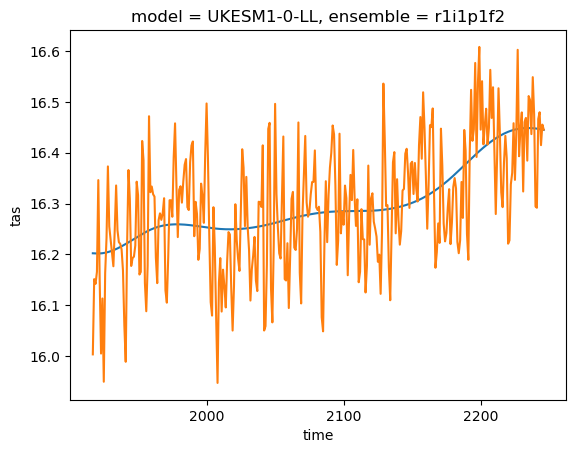

In [68]:
imf_data[-1].isel(imf=[-1, -2]).sum(dim='imf').plot()

a1_full_smean_data[-1].squeeze().plot()

In [69]:
imf_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'imf': 5, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'imf': 5, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'imf': 4, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'imf': 5, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'imf': 6, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'imf': 5, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'imf': 5, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'imf': 5, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'imf': 6, 'time': 330})

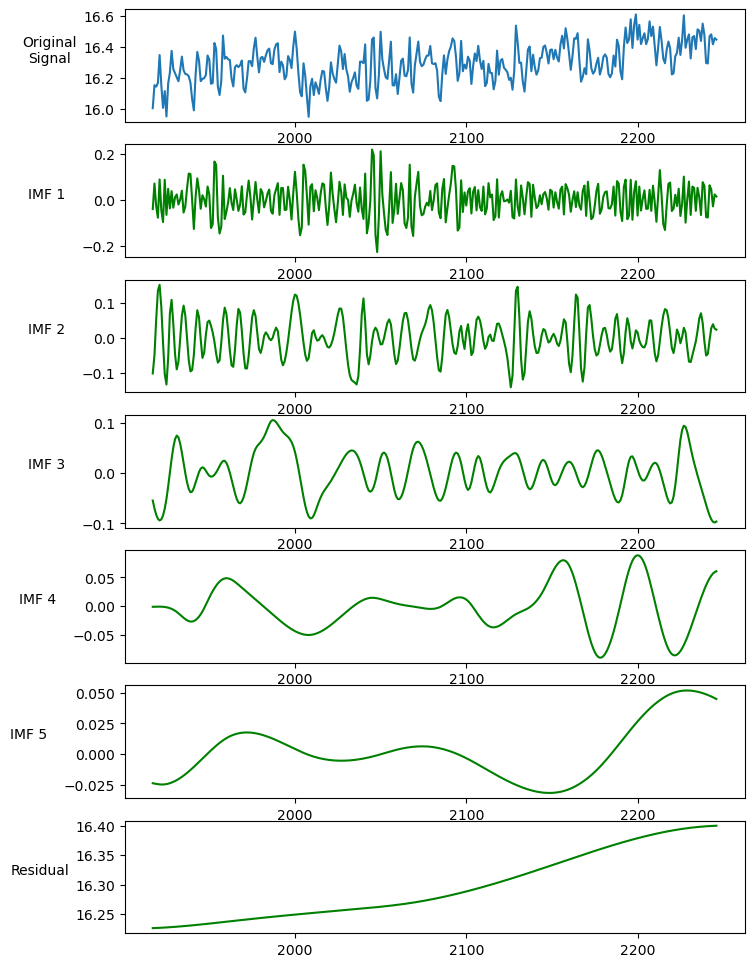

In [70]:
imf_da = imf_data[-1]

# Plot the results
n_imfs = len(imf_da.imf)
fig = plt.figure(figsize=(8, 12))
gs = gridspec.GridSpec(n_imfs+1, 1, hspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(n_imfs+1)]

# Plot original signal
axes[0].plot(a1_full_smean_data[-1].squeeze().time.values, 
             a1_full_smean_data[-1].squeeze().values)
axes[0].set_ylabel("Original\nSignal", rotation=0, labelpad=25)

# Plot IMFs
for i in range(n_imfs):
    axes[i + 1].plot(imf_data[-1].time.values, imf_data[-1].squeeze().sel(imf=i), color='green')

    axes[i + 1].set_ylabel(f"IMF {i + 1}" if i < n_imfs-1 else 'Residual', rotation=0, labelpad=25)

### Saving IMFs

Note this is just precautionary if the environment decides to break again, there is a back up

In [71]:
SAVE_DIR = '/g/data/w40/ab2313/zecmip_new_temp_estimation/ceemdan_gmst_v2'

In [72]:
# ceedman_data.to_netcdf(SAVE_DIR)

In [73]:
imf_data = read_listxarray(SAVE_DIR).compute().to_dataarray('tas')

In [74]:
imf_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'imf': 5, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'imf': 5, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'imf': 4, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'imf': 5, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'imf': 6, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'imf': 5, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'imf': 5, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'imf': 5, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'imf': 6, 'time': 330})

In [75]:
# imf_data = ceedman_data
ceedman_data = imf_data

### Filtering IMFs

In [76]:
def fft_frequency(imf, time=None):
    if time is None: time = np.arange(len(imf))

    # Compute FFT
    fft_vals = np.fft.fft(imf)
    freqs = np.fft.fftfreq(len(imf), d=(time[1] - time[0]))
    
    # Get positive frequencies and corresponding power
    positive_freqs = freqs[freqs > 0]
    power_spectrum = np.abs(fft_vals[freqs > 0])**2

    return power_spectrum, positive_freqs

In [77]:
def dominant_frequency(imf, time=None):

    if time is None: time = np.arange(len(imf))

    power_spectrum, positive_freqs  = fft_frequency(imf, time)
    # Dominant frequency is the one with the highest power
    dominant_freq = positive_freqs[np.argmax(power_spectrum)]
    
    return dominant_freq

# Convert frequency to wavelength (years per cycle)
def frequency_to_wavelength(freq):
    return 1 / freq

In [78]:
def filter_imf_arr(imfs, time, wavelength_threshold:int=50):
    # Filter IMFs based on their wavelength
    filtered_imfs = []
    for imf in imfs:
        freq = dominant_frequency(imf, time)
        wavelength = frequency_to_wavelength(freq)
        
        if wavelength >= wavelength_threshold:
            filtered_imfs.append(imf)
        # Convert the list of filtered IMFs back to an array
    filtered_imfs = np.array(filtered_imfs)
    return filtered_imfs

In [79]:
def filter_imfs_by_wavelgnth(imf_da, wavelength_threshold:int=50):
    imfs = imf_da.squeeze().values
    time = np.arange(0, len(imf_da.time.values))
    filtered_imfs = filter_imf_arr(imfs, time, wavelength_threshold)

    n_filtered_imfs = filtered_imfs.shape[0]

    imf_filtered_da = xr.zeros_like(imf_da.isel(imf=slice(-n_filtered_imfs, None)))
    
    imf_filtered_da += filtered_imfs
    return imf_filtered_da

In [80]:
from scipy.signal import hilbert

def instantaneous_frequency_hilbert(imf, time=None):
    """
    Compute the instantaneous frequency of an IMF using the Hilbert Transform.
    """
    if time is None:
        time = np.arange(len(imf))
    
    # Hilbert Transform to get the analytic signal
    analytic_signal = hilbert(imf)
    # Compute the instantaneous phase
    instantaneous_phase = np.unwrap(np.angle(analytic_signal))
    # Instantaneous frequency is the derivative of phase
    dt = time[1] - time[0]  # Sampling interval
    inst_freq = np.diff(instantaneous_phase) / (2 * np.pi * dt)
    
    return np.abs(inst_freq)

# Example usage
def mean_instantaneous_frequency_hilbert(imf, time=None):
    """
    Calculate the mean instantaneous frequency of an IMF.
    """
    inst_freq = instantaneous_frequency_hilbert(imf, time)
    return np.mean(inst_freq)

In [81]:
def filter_imf_arr_hilbert(imfs, time, wavelength_threshold:int=50):
    # Filter IMFs based on their wavelength
    filtered_imfs = []
    for imf in imfs:
        freq = mean_instantaneous_frequency_hilbert(imf, time)
        wavelength = frequency_to_wavelength(freq)
        
        if wavelength >= wavelength_threshold:
            filtered_imfs.append(imf)
        # Convert the list of filtered IMFs back to an array
    filtered_imfs = np.array(filtered_imfs)
    return filtered_imfs

In [82]:
def filter_imfs_by_wavelgnth_hilbert(imf_da, wavelength_threshold:int=50):
    imfs = imf_da.squeeze().values
    time = np.arange(0, len(imf_da.time.values))
    filtered_imfs = filter_imf_arr_hilbert(imfs, time, wavelength_threshold)

    n_filtered_imfs = filtered_imfs.shape[0]

    imf_filtered_da = xr.zeros_like(imf_da.isel(imf=slice(-n_filtered_imfs, None)))
    
    imf_filtered_da += filtered_imfs
    return imf_filtered_da

In [83]:
imf_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'imf': 5, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'imf': 5, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'imf': 4, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'imf': 5, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'imf': 6, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'imf': 5, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'imf': 5, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'imf': 5, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'imf': 6, 'time': 330})

array(['ACCESS-ESM1-5', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC',
       'MIROC-ES2L', 'MPI-ESM1-2-LR', 'NorESM2-LM', 'UKESM1-0-LL'],
      dtype='<U14')

In [186]:
imf_filtered_data = listXarray(
    [filter_imfs_by_wavelgnth_hilbert(
        ds, wavelength_threshold=56 if 'Nor' not in model else 50)
     for model, ds in imf_data],
    'model',imf_data.refkeys
)

In [187]:
# imf_filtered_data = imf_data(filter_imfs_by_wavelgnth_hilbert, wavelength_threshold=56)
# imf_filtered_data

In [188]:
# imf_filtered_data = imf_data(filter_imfs_by_wavelgnth)
# imf_filtered_data

### Worked Example

In [189]:
imf_data[model]

<xarray.DataArray 'tas' (model: 1, imf: 6, time: 330)> Size: 16kB
-0.04112 0.07043 -0.02803 -0.07868 0.08817 -0.04651 ... 16.4 16.4 16.4 16.4 16.4
Coordinates:
  * model    (model) <U11 44B 'UKESM1-0-LL'
  * imf      (imf) int64 48B 0 1 2 3 4 5
  * time     (time) object 3kB 1916-12-30 00:00:00 ... 2245-12-30 00:00:00

#### Worked Example

In [190]:
imodel = 7
imfs = imf_data[imodel].squeeze().values
time = np.arange(imf_data[imodel].squeeze().time.values.shape[0])

In [191]:
imf_data.model[imodel]

'NorESM2-LM'

In [192]:
imfs.shape

(5, 100)

In [193]:
imf = imfs[3]

In [194]:
fft_vals = np.fft.fft(imf)
fft_vals.shape

(100,)

In [195]:
freqs = np.fft.fftfreq(len(imf), d=(time[1] - time[0]))
freqs.shape

(100,)

In [196]:
# Get positive frequencies and corresponding power
positive_freqs = freqs[freqs > 0]
power_spectrum = np.abs(fft_vals[freqs > 0])**2

# Dominant frequency is the one with the highest power
dominant_freq = positive_freqs[np.argmax(power_spectrum)]

In [197]:
dominant_freq

0.02

In [198]:
power_spectrum.shape

(49,)

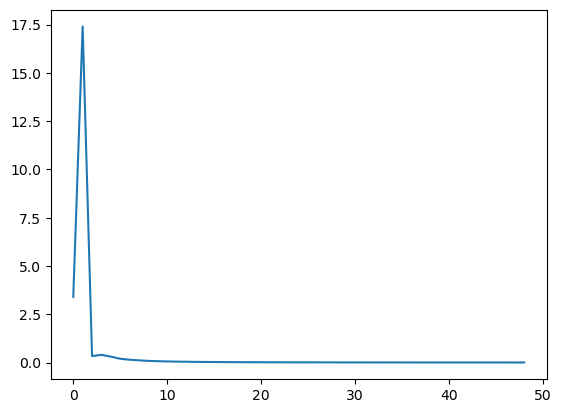

In [199]:
plt.plot(power_spectrum)

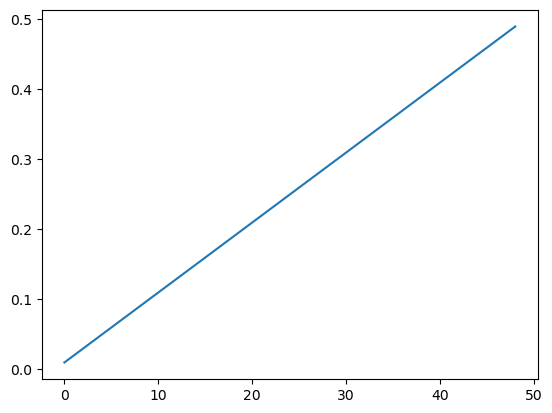

In [200]:
plt.plot(positive_freqs)

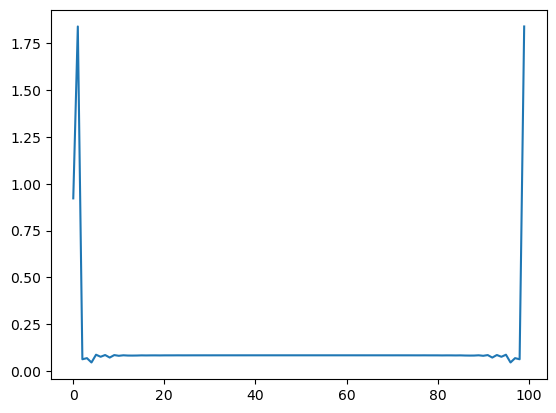

In [201]:
plt.plot(fft_vals)

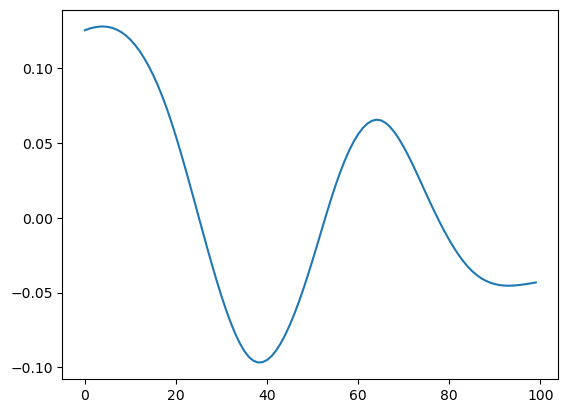

In [202]:
plt.plot(imf)

In [203]:
imodel = -1
imfs = imf_data[imodel].squeeze().values
time = np.arange(imf_data[imodel].squeeze().time.values.shape[0])
imf_data.model[imodel]

'UKESM1-0-LL'

In [204]:
# Threshold for filtering (wavelengths less than 30 years)
threshold = 50

# Filter IMFs based on their wavelength
filtered_imfs = []
for num,imf in enumerate(imfs):
    freq = dominant_frequency(imf, time)
    wavelength = frequency_to_wavelength(freq)

    print(num, freq, wavelength)
    
    if wavelength >= threshold:
        filtered_imfs.append(imf)

# Convert the list of filtered IMFs back to an array
filtered_imfs = np.array(filtered_imfs)

print(f"Number of filtered IMFs: {filtered_imfs.shape[0]}")


0 0.19696969696969696 5.0769230769230775
1 0.07575757575757576 13.2
2 0.021212121212121213 47.14285714285714
3 0.021212121212121213 47.14285714285714
4 0.00909090909090909 110.0
5 0.0030303030303030303 330.0
Number of filtered IMFs: 2


In [205]:
filtered_imfs.shape

(2, 330)

In [206]:
tps = np.sum(filtered_imfs, axis=0)

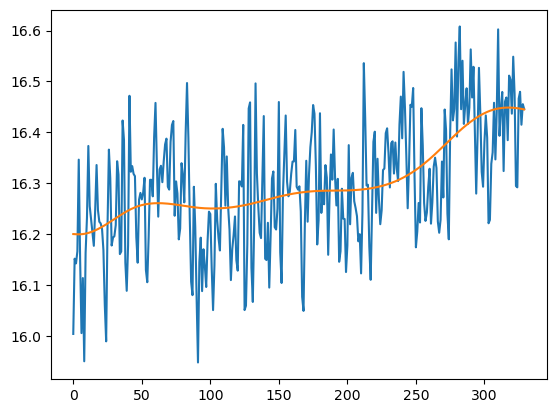

In [207]:
plt.plot(a1_smean_data[imodel].squeeze().values)
plt.plot(tps)

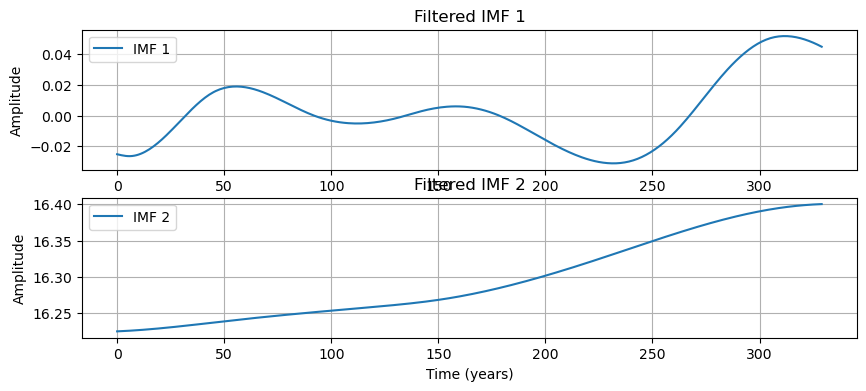

In [208]:
# Plotting the filtered IMFs
plt.figure(figsize=(10, len(filtered_imfs) * 2))

for i, imf in enumerate(filtered_imfs):
    plt.subplot(len(filtered_imfs), 1, i + 1)
    plt.plot(time, imf, label=f'IMF {i + 1}')
    plt.title(f'Filtered IMF {i + 1}')
    plt.xlabel('Time (years)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()

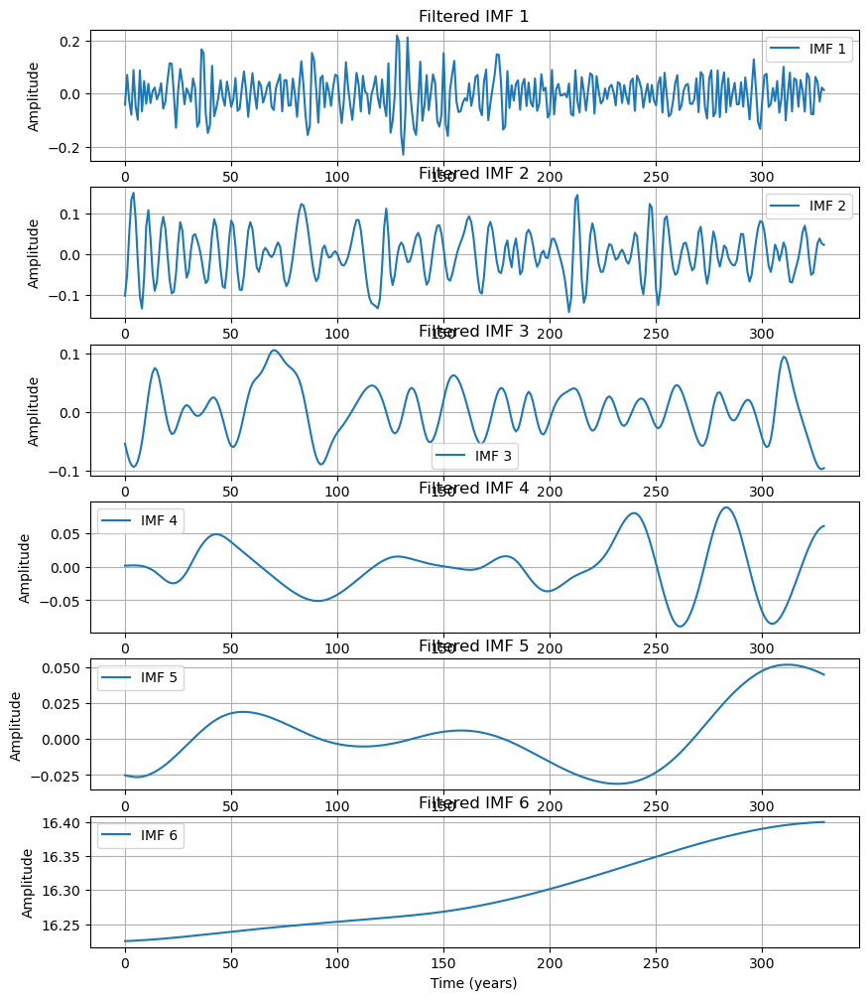

In [209]:
# Plotting the filtered IMFs
plt.figure(figsize=(10, len(imfs) * 2))

for i, imf in enumerate(imfs):
    plt.subplot(len(imfs), 1, i + 1)
    plt.plot(time, imf, label=f'IMF {i + 1}')
    plt.title(f'Filtered IMF {i + 1}')
    plt.xlabel('Time (years)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()

<h2 style='color: cyan'>Constructing Potential Series</h2> 

In [210]:
imf_filtered_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'imf': 1, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'imf': 1, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'imf': 1, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'imf': 2, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'imf': 2, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'imf': 2, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'imf': 2, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'imf': 2, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'imf': 2, 'time': 330})

In [211]:
# The potential series is the sum of the residual (last imf) and second last imf
potential_series_data = imf_filtered_data.sum(dim='imf')
potential_series_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'time': 330})

In [212]:
potential_series_da = potential_series_data.copy()(utils.reset_time_to_0_start).concat('model')
potential_series_anom_da = potential_series_da - potential_series_da.isel(time=0)

In [213]:
a1_smean_da = a1_smean_data(utils.reset_time_to_0_start).concat('model')
a1_smean_anom_emd_da  = a1_smean_da - potential_series_da.isel(time=0)

In [214]:
lowess_gm_da = lowess_3_gm_data.copy()(utils.reset_time_to_0_start).concat('model')
lowess_gm_anom_da = lowess_gm_da - lowess_gm_da.isel(time=0)

In [215]:
# Setting time to be just an interger
potential_series_anom_da['time'] = np.arange(0, 330)
lowess_gm_anom_da['time'] = np.arange(0, 330)
a1_smean_anom_emd_da['time'] = np.arange(0, 330)

In [216]:
# THe anomalies of the potential series at the years 50, 90 and at the final points
imf50_anom_da = (potential_series_data.isel(time=50).concat('model')-\
                   potential_series_data.isel(time=0).concat('model'))

imf90_anom_da = (potential_series_data.isel(time=90).concat('model')-\
                   potential_series_data.isel(time=0).concat('model'))

imffinal_anom_da = (potential_series_data.isel(time=-1).concat('model')-\
                   potential_series_data.isel(time=0).concat('model'))

In [217]:
zec50_smean_da = zec50_smean_da.drop('ensemble', errors='ignore').sortby('model')
imf50_anom_da = imf50_anom_da.sortby('model')

In [218]:
# # THe wavlength of each imf
# gmst_wavelength_data_2 = apply_ufunc(
#     lambda x: frequency_to_wavelength(dominant_frequency(x)),
#     imf_data,
#     input_core_dims=[["time"]], 
#     vectorize=True)

In [219]:
# THe wavlength of each imf
gmst_wavelength_data = apply_ufunc(
    lambda x: frequency_to_wavelength(mean_instantaneous_frequency_hilbert(x)),
    imf_data,
    input_core_dims=[["time"]], 
    vectorize=True)

In [220]:
imf_wavelength_df = pd.DataFrame({key:value['imf'] for key, value in gmst_wavelength_data.to_dict().items()})

In [221]:
imf_wavelength_df

,ACCESS-ESM1-5,CESM2,CanESM5,GFDL-ESM4,GISS-E2-1-G-CC,MIROC-ES2L,MPI-ESM1-2-LR,NorESM2-LM,UKESM1-0-LL
0,3.682324,2.945691,3.487272,3.771555,3.776148,4.523740,3.781700,3.883684,3.638504
1,8.472229,7.040732,9.055563,9.043640,7.718169,9.228683,8.409927,8.889261,7.995221
2,16.807354,13.841956,25.094076,28.193371,15.992451,22.895530,18.745937,19.846320,21.325293
3,30.006701,41.083296,14184.878585,65.527480,45.950993,63.143035,61.182875,52.595291,55.339661
4,28179.718760,12403.910429,NaN,34415.564793,179.547646,20654.001748,12583.763843,98560.168993,119.044495
5,NaN,NaN,NaN,NaN,110537.318877,NaN,NaN,NaN,46875.693464


In [222]:
# # THe wavlength of each imf
# gmst_wavelengths = xr.apply_ufunc(
#     lambda x: frequency_to_wavelength(dominant_frequency(x)),
#     imf_data[imodel],
#     input_core_dims=[["time"]], 
#     vectorize=True)

In [223]:
# The variance of each imf
imf_var_data = imf_data(partial(np.var, axis=2))

In [224]:
# Turning this into a daataframe for easier read
imf_var_df = pd.DataFrame({key:value['imf'] for key, value in imf_var_data.to_dict().items()})
imf_var_df.index.name ='imf'

<h1 style='color: yellow'> GMST Plots </h1>

In [225]:
models = potential_series_anom_da['model'].values  # Use values to get the model dimension

UKESM1-0-LL


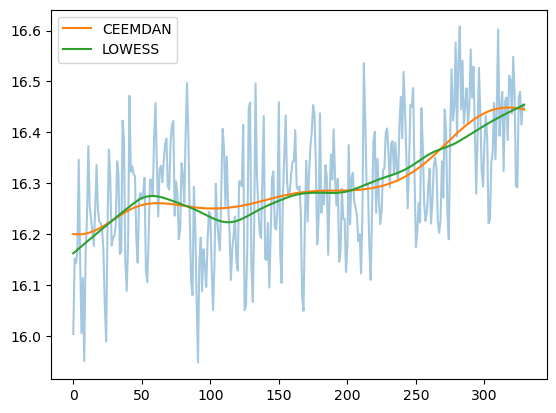

In [226]:
imodel = -1#'UKESM1-0-LL'
model = a1_smean_data.model[imodel]
print(model)
plt.plot(a1_smean_data[model].squeeze().values, alpha=0.4)
plt.plot(imf_data[model].isel(imf=[-1, -2]).sum(dim='imf').squeeze().values, label='CEEMDAN')
plt.plot(lowess_5_gm_data[model].squeeze().values, label='LOWESS');
plt.legend()

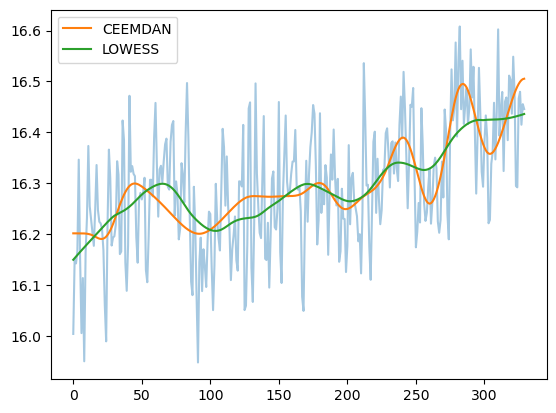

In [227]:
# model = 'UKESM1-0-LL'
plt.plot(a1_smean_data[model].squeeze().values, alpha=0.4)
plt.plot(imf_data[model].isel(imf=[-1, -2, -3]).sum(dim='imf').squeeze().values, label='CEEMDAN')
plt.plot(lowess_3_gm_data[model].squeeze().values, label='LOWESS');
plt.legend()

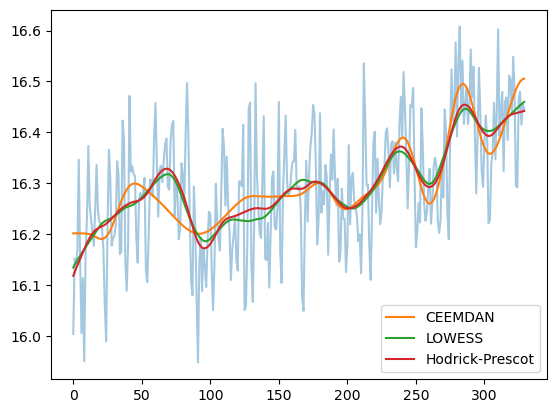

In [228]:
# model = 'UKESM1-0-LL'
plt.plot(a1_smean_data[model].squeeze().values, alpha=0.4)
plt.plot(imf_data[model].isel(imf=[-1, -2, -3]).sum(dim='imf').squeeze().values, label='CEEMDAN')
plt.plot(lowess_2_gm_data[model].squeeze().values, label='LOWESS');
plt.plot(hp_trend, label='Hodrick-Prescot');
plt.legend()

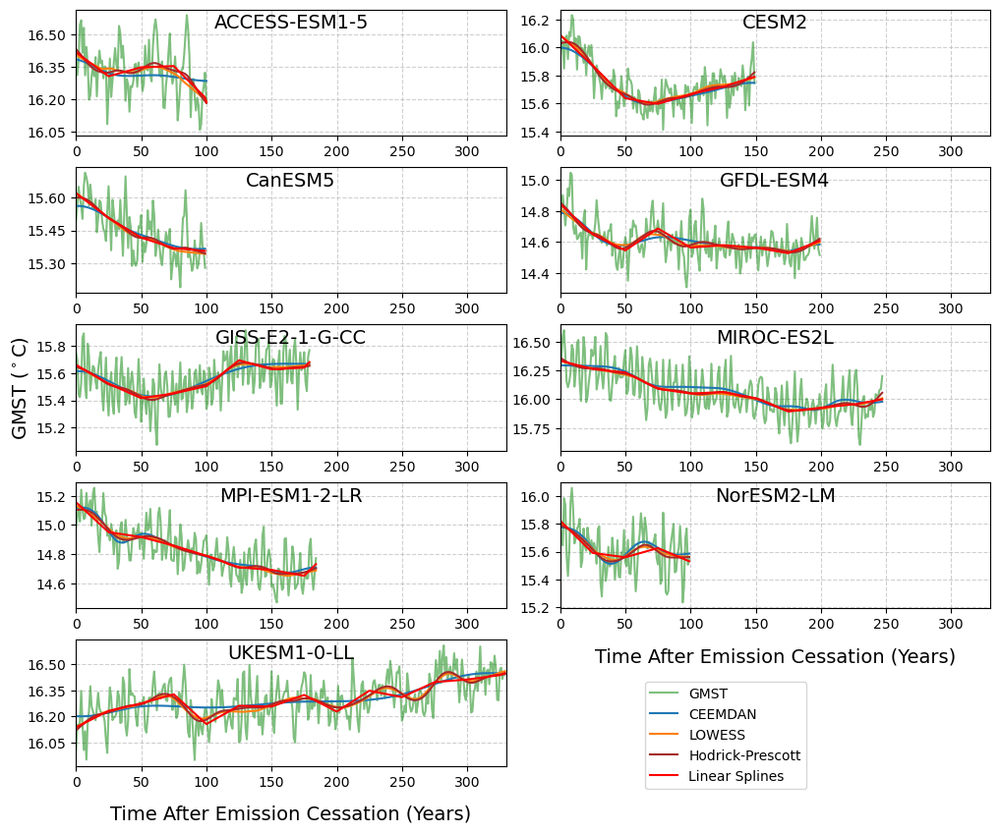

In [229]:
models = pct_smean_data.model

ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.25, wspace=0.125)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    ax = axes[num]
    time = np.arange(a1_full_smean_data[model].time.shape[0])
    a1_raw_vals = a1_full_smean_data[model].squeeze().values
    
    potential_series_vals = potential_series_data[model].squeeze().values
    
    # Plot the data for each model
    ax.plot(time, a1_raw_vals , color='green', label='GMST', alpha=0.5)
    ax.plot(time, potential_series_vals, label='CEEMDAN')

    ax.plot(time, lowess_2_gm_data[model].squeeze().values, label='LOWESS');
    ax.plot(time, hp_trend_data[model].squeeze().values, label='Hodrick-Prescott', color='brown');
    
    ax.plot(time, linear_spline_data[model].squeeze().values, label='Linear Splines', color='red');
    
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_title('')
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))

    if num == int(len(models)/2):  axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    else:  ax.set_ylabel('')


    ax.set_xlim(0, 330)


# Add a legend in the lower left hand corner
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(0.75, 0.08))

# Labeling x-axis for specific subplots
for ax_num in [-1, -2]:
    ax = axes[ax_num]
    ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', 
                  fontsize=14, labelpad=25 if ax_num < 0 else 12)


In [230]:
# Create a color palette for the unique models
colors = sns.color_palette("husl", len(models))

(-0.6, 0.3)

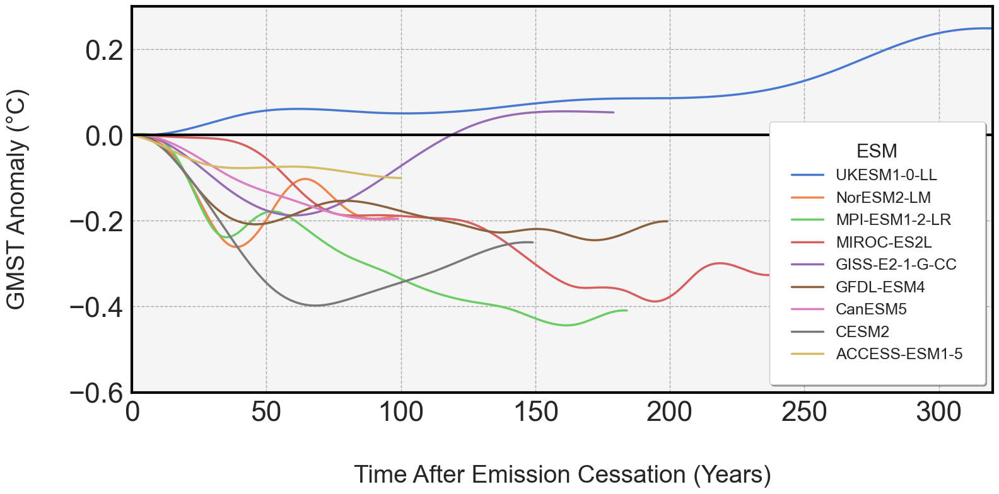

In [231]:
models = ['ACCESS-ESM1-5', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC',
       'MIROC-ES2L', 'MPI-ESM1-2-LR', 'NorESM2-LM', 'UKESM1-0-LL'][::-1]


# Text scaling factor
scale = 2  # Change this to adjust all text sizes

# Set up Seaborn theme with a clean, high-contrast style for presentations
sns.set(style="whitegrid")

# Create figure and axis with a large size for presentation
fig = plt.figure(figsize=(16, 8))
ax = fig.add_subplot(1, 1, 1)

# Loop through models and plot each with customized settings
for num, model in enumerate(models):
    color = sns.color_palette("muted", len(models))[num]  # Husl color palette for vivid colors
    potential_series_anom_da.sel(model=model).plot(ax=ax, color=color, label=model, 
                                                   linewidth=2.5, alpha=1)  # Thicker lines

# Add horizontal line at y=0 with a thicker line and darker color
ax.axhline(0, color='black', linestyle='-', linewidth=3)

# Set x and y axis limits if needed
ax.set_xlim(0, 320)

# Customize grid with subtle settings
ax.grid(True, linestyle='--', color='grey', alpha=0.65)

# Customize axis labels and title with scaling applied
ax.set_xlabel('Time After Emission Cessation (Years)', fontsize=14 * scale, 
              # fontweight='bold',
              labelpad=22 * scale)
ax.set_ylabel('GMST Anomaly (°C)', fontsize=14 * scale, 
              # fontweight='bold', 
              labelpad=22 * scale)
ax.set_title('')


# Enhance tick parameters: bigger ticks with scaling
ax.tick_params(axis='both', which='major', labelsize=16 * scale, width=2 * scale)

# Adding a legend with scaling
ax.legend(title='ESM', title_fontsize=22, fontsize=18 , loc='lower right', 
          frameon=True, fancybox=True, shadow=True, borderpad=0.7 * scale)

# Add annotation to highlight key points, e.g., an important model trend
max_anom = potential_series_anom_da.max().values
max_time = potential_series_anom_da['time'].values[-1]  # Last time point


# Customize the background and border for extra flair
ax.set_facecolor('#f5f5f5')  # Light grey background
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.5 * scale)

# Tight layout to improve spacing
plt.tight_layout()

# Show plot
ax.set_ylim(-0.6, 0.3)

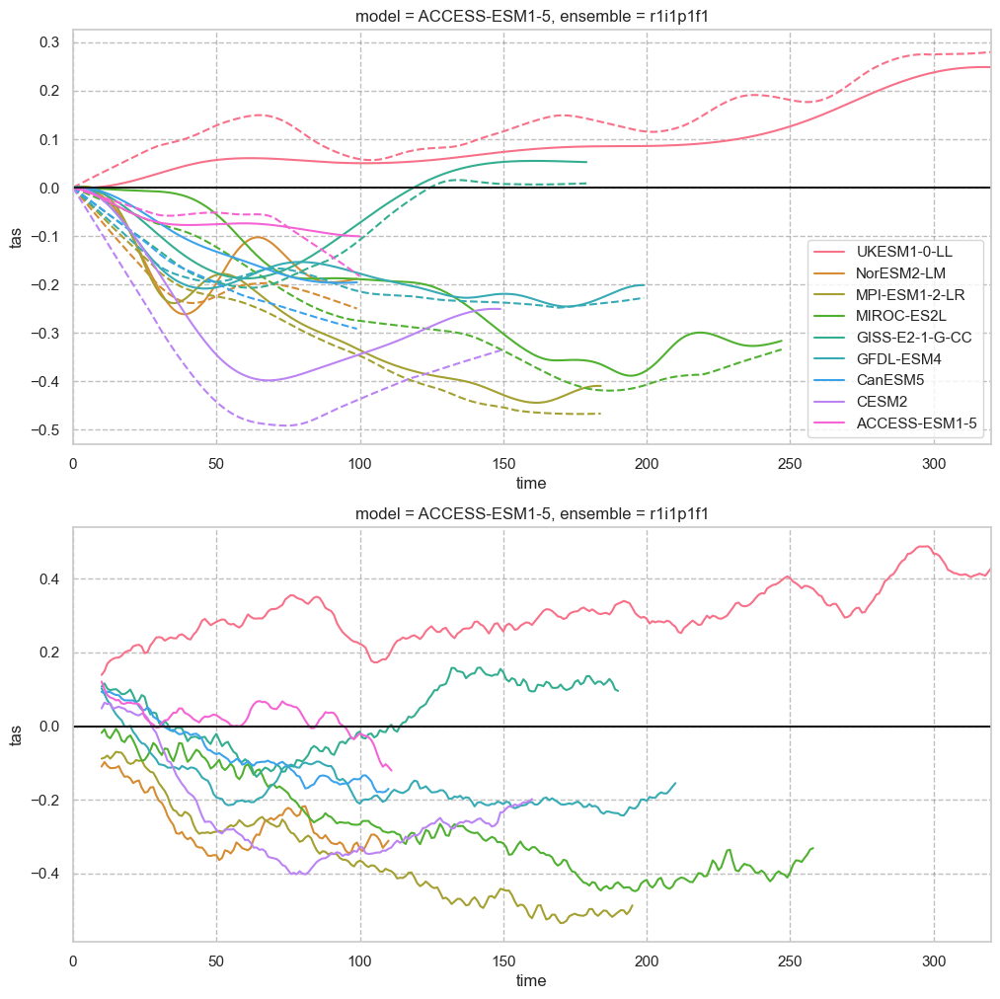

In [232]:
fig = plt.figure(figsize=(12, 12))
axes = [fig.add_subplot(2, 1, i+1) for i in range(2)]

for num, model in enumerate(models):
 
    color = colors[num]
    potential_series_anom_da.sel(model=model).plot(ax=axes[0], color=color, label=model);
    # a1_smean_anom_emd_da.sel(model=model).plot(ax=axes[0], color=color, label=model, alpha=0.25);
    lowess_gm_anom_da.sel(model=model).plot( ax=axes[0], linestyle='--', color=color);
    a1_smean_anom_t0_da.sel(model=model).rolling(time=20, min_periods=10).mean().plot(
        ax=axes[1], color=color);

for ax in axes:
    ax.axhline(0, color='k' )
    ax.grid(True, linestyle='--', color='grey', alpha=0.5)
    ax.set_xlim(0, 320)

axes[0].legend()

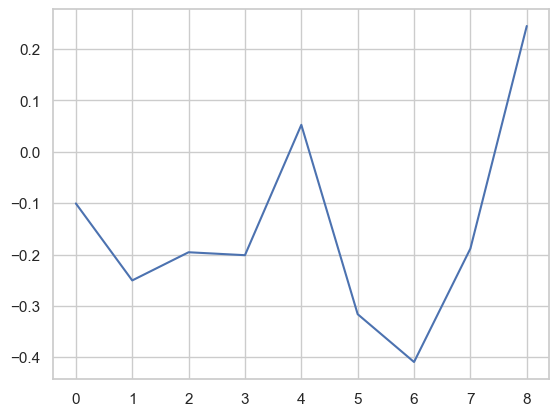

In [233]:
plt.plot(imffinal_anom_da.values)#.plot()

In [234]:
zec50_smean_da .min(), zec50_smean_da.max(),zec50_smean_da.median()

(<xarray.DataArray 'tas' ()> Size: 8B
 -0.3344,
 <xarray.DataArray 'tas' ()> Size: 8B
 0.2892,
 <xarray.DataArray 'tas' ()> Size: 8B
 -0.1087)

In [235]:
np.min(imf50_anom_da.values),np.max(imf50_anom_da.values), np.median(imf50_anom_da.values)

(-0.344847648118785, 0.05693954270362056, -0.17605223957365723)

In [236]:
np.min(imf90_anom_da.values),np.max(imf90_anom_da.values), np.median(imf90_anom_da.values)

(-0.3641367535187676, 0.05204627150020258, -0.18715430955208845)

In [237]:
zec50_smean_da.median(), zec50_smean_da.mean()

(<xarray.DataArray 'tas' ()> Size: 8B
 -0.1087,
 <xarray.DataArray 'tas' ()> Size: 8B
 -0.1244)

In [238]:
imf50_anom_da.median(), imf50_anom_da.mean()

(<xarray.DataArray 'tas' ()> Size: 8B
 -0.1761,
 <xarray.DataArray 'tas' ()> Size: 8B
 -0.1456)

In [239]:
def plot_temperature_change(x_values, y1, y2, c1='magenta', c2='green', year_num=50, ax=None,
                           fig=None):
    """
    Plots the temperature change after 50 years for two datasets.

    Parameters:
        x_values (np.ndarray): Array of model names or x-values.
        y1 (np.ndarray): Data array for the first dataset (ZEC50).
        y2 (np.ndarray): Data array for the second dataset (EEMD).
        c1 (str): Color for the first dataset bars (default is 'magenta').
        c2 (str): Color for the second dataset bars (default is 'green').
    """
    plt.style.use('default')
    # Create an array for the y-axis positions
    y = np.arange(len(x_values))

    # Set up the bar height and text offset
    bar_height = 0.35

    # Create the plot
    if ax is None:
        fig, ax = plt.subplots()

    # For y1 dataset
    ax.barh(9 - bar_height / 2, np.max(y1) - np.min(y1), 
            bar_height, left=np.min(y1), color=c1)
    
    # For y2 dataset (EEMD)
    ax.barh(9 + bar_height / 2, np.max(y2) - np.min(y2), 
            bar_height, left=np.min(y2), color=c2)
    
    # Adjust lines to still represent the original min and max if needed
    ax.plot([np.min(y1), np.max(y1)], [9 - bar_height / 2, 9 - bar_height / 2], color=c1)
    ax.plot([np.min(y2), np.max(y2)], [9 + bar_height / 2, 9 + bar_height / 2], color=c2)

    # Plot the bars for each dataset
    bars1 = ax.barh(y - bar_height / 2, y1, bar_height, label='20-Year Average', color=c1)
    bars2 = ax.barh(y + bar_height / 2, y2, bar_height, label='CEEMDAN', color=c2)

    # Add labels and title
    ax.set_ylabel('Earth System Model')
    ax.set_xlabel(f'Temperature Change After {year_num} years ' + r'($^\circ$C)')
    y = np.append(y, 9)
    ax.set_yticks(y)
    x_values = np.append(x_values, 'Model Range')
    ax.set_yticklabels(x_values)
    ax.legend(loc='lower right')

    ax.axvline(0, color='k', linewidth=0.6)

    # Add vertical lines between each bar set for better model division
    for pos in y:
        ax.axhline(y=pos + 1.5 * bar_height, color='gray', linestyle='--', linewidth=0.5)

    text_offset_base = 0.07  # Variable for text offset

    for i in range(len(y1)):
        text_offset1 = 0 if y1[i] >= 0 else -text_offset_base
        ax.text(y1[i] + text_offset1, i - bar_height / 2, f"{y1[i]:.2f}", va='center', ha='left', color=c1)

        text_offset2 = 0 if y2[i] >= 0 else -text_offset_base
        ax.text(y2[i] + text_offset2, i + bar_height / 2, f"{y2[i]:.2f}", va='center', ha='left', color=c2)

    ax.set_xlim(-0.55, 0.4)

    ax.vlines(x=np.median(y1), ymin=9 - 0.9 * bar_height, ymax=9, color='k', linewidth=2)
    ax.vlines(x=np.median(y2), ymin=9, ymax=9 + bar_height, color='k', linewidth=2)
    ax.annotate(f'{np.median(y1):.2f}', xy=(np.median(y1), 9 - 3.2 * bar_height / 2), ha='center', va='center', 
                color=c1)

    ax.annotate(f'{np.median(y2):.2f}', xy=(np.median(y2), 9 + 3.2 * bar_height / 2), ha='center', va='center', 
                color=c2)

    ax.text(np.max(y1), y[-1] - bar_height / 2, f"{np.max(y1):.2f}", va='center', ha='left', color=c1)
    ax.text(np.min(y1) - text_offset_base, y[-1] - bar_height / 2, f"{np.min(y1):.2f}", va='center',
            ha='left', color=c1)

    ax.set_ylim(y[0] - bar_height * 3 / 2, None)
    ax.text(np.max(y2), y[-1] + bar_height / 2, f"{np.max(y2):.2f}", va='center', ha='left', color=c2)
    ax.text(np.min(y2) - text_offset_base, y[-1] + bar_height / 2, f"{np.min(y2):.2f}", va='center',
            ha='left', color=c2)

    fig.suptitle(f'GMST Changes {year_num} Years After Emission Cessation',
                fontsize=12, y=0.92)

In [240]:
def plot_temperature_change_v2(x_values, y1, y2, c1='magenta', c2='green', year_num=50):
    """
    Plots the temperature change after 50 years for two datasets.

    Parameters:
        x_values (np.ndarray): Array of model names or x-values.
        y1 (np.ndarray): Data array for the first dataset (ZEC50).
        y2 (np.ndarray): Data array for the second dataset (EEMD).
        c1 (str): Color for the first dataset bars (default is 'magenta').
        c2 (str): Color for the second dataset bars (default is 'green').
    """
    plt.style.use('default')
    y = np.arange(len(x_values))

    bar_height = 0.35

    fig = plt.figure(figsize=(8, 6))
    gs = gridspec.GridSpec(2, 1, height_ratios=[0.14, 0.9], hspace=0.05)
    ax0 = fig.add_subplot(gs[0])
    ax = fig.add_subplot(gs[1])
    
    # Plot dataset ranges in ax0
    ax0.barh(1 - bar_height / 2, np.max(y1) - np.min(y1), bar_height, left=np.min(y1), color=c1)
    ax0.barh(1 + bar_height / 2, np.max(y2) - np.min(y2), bar_height, left=np.min(y2), color=c2)
    ax0.plot([np.min(y1), np.max(y1)], [1 - bar_height / 2] * 2, color=c1)
    ax0.plot([np.min(y2), np.max(y2)], [1 + bar_height / 2] * 2, color=c2)
    
    # Main bars for each dataset in ax
    bars1 = ax.barh(y - bar_height / 2, y1, bar_height, label='20-Year Average', color=c1)
    bars2 = ax.barh(y + bar_height / 2, y2, bar_height, label='CEEMDAN', color=c2)

    ax.set_ylabel('Earth System Model', fontsize=12)
    ax.set_yticks(y)
    ax.set_yticklabels(x_values)
    ax.legend(loc='lower right')
    ax.axvline(0, color='k', linewidth=0.6)
    ax0.axvline(0, color='k', linewidth=0.6, zorder=-1000)

    for pos in y:
        ax.axhline(y=pos + 1.5 * bar_height, color='gray', linestyle='--', linewidth=0.5)

    text_offset_base = 0.07

    for i in range(len(y1)):
        text_offset1 = 0 if y1[i] >= 0 else -text_offset_base
        ax.text(y1[i] + text_offset1, i - bar_height / 2, f"{y1[i]:.2f}", va='center', ha='left', color=c1)

        text_offset2 = 0 if y2[i] >= 0 else -text_offset_base
        ax.text(y2[i] + text_offset2, i + bar_height / 2, f"{y2[i]:.2f}", va='center', ha='left', color=c2)

    ax.set_xlim(-0.55, 0.4)
    ax0.set_xlim(-0.55, 0.4)



    # ax0.vlines(x=np.median(y1), ymin=-1, ymax=-1, color=c1, linewidth=2)
    # ax0.vlines(x=np.median(y2), ymin=1, ymax=1, color=c2, linewidth=2)

    ax0.annotate(f'{np.median(y1):.2f}', xy=(np.median(y1), 1 - 1.5 * bar_height), ha='center', va='center', color=c1)
    ax0.annotate(f'{np.median(y2):.2f}', xy=(np.median(y2), 1 + 1.5 * bar_height), ha='center', va='center', color=c2)
    ax0.annotate(f'{np.min(y1):.2f}', xy=(np.min(y1)-0.06, 1-bar_height), color='magenta')
    ax0.annotate(f'{np.max(y1):.2f}', xy=(np.max(y1)+0.01, 1-bar_height), color='magenta')

    ax0.annotate(f'{np.min(y2):.2f}', xy=(np.min(y2)-0.06, 1+bar_height/10), color='green')
    ax0.annotate(f'{np.max(y2):.2f}', xy=(np.max(y2)+0.01, 1+bar_height/10), color='green')

    

    ax0.set_yticks([1])
    ax0.set_yticklabels(['Model Range'])
    ax0.set_ylim(1-2.2*bar_height, 1+2.2*bar_height)

    ax0.xaxis.set_label_position('top')
    ax0.xaxis.tick_top()

    ax0.vlines(x=np.median(y1), ymin=1 - 0.9 * bar_height, ymax=1, color='k', linewidth=2)
    ax0.vlines(x=np.median(y2), ymin=1, ymax=1 + bar_height, color='k', linewidth=2)
    
    fig.suptitle(f'GMST Changes {year_num} Years After Emission Cessation' + r'($^\circ$C)', 
                 fontsize=12, y=0.97)
    ax.set_xlabel(f'GMST Changes {year_num} Years After Emission Cessation' + r'($^\circ$C)',
                  fontsize=12)
    # ax.set_xlabel(f'Temperature Change After {year_num} years ' + r'($^\circ$C)')


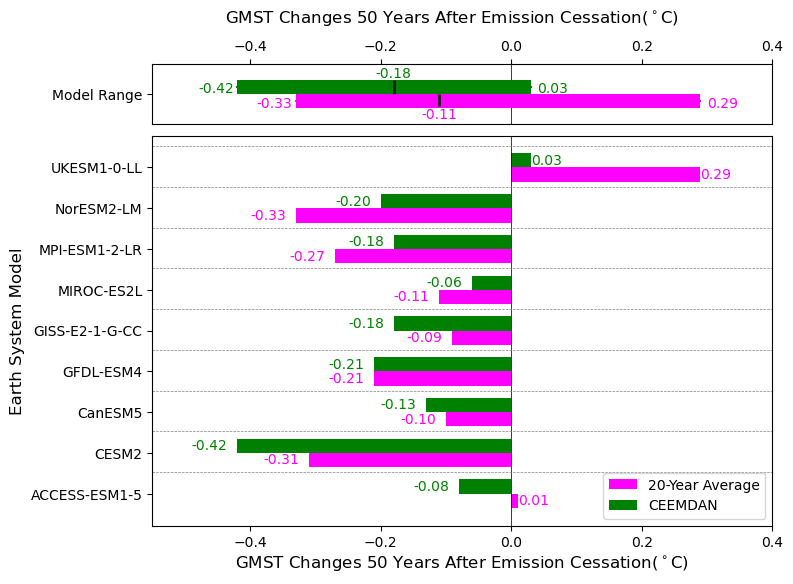

In [241]:
ceemdan_repeat_values = [0.03, -0.2, -0.18, -0.06, -0.18, -0.21, -0.13, -0.42, -0.08][::-1]
zec_50_repeat_values =  [0.29, -0.33, -0.27, -0.11, -0.09, -0.21, -0.10, -0.31, 0.01][::-1]
plot_temperature_change_v2(zec50_smean_da.model.values, zec_50_repeat_values, ceemdan_repeat_values, 
                        c1='magenta', c2='green')


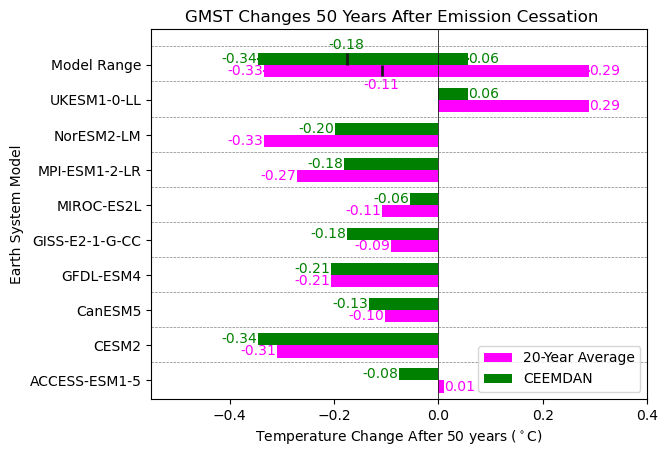

In [298]:
plot_temperature_change(zec50_smean_da.model.values, zec50_smean_da.values, imf50_anom_da.values, 
                        c1='magenta', c2='green')

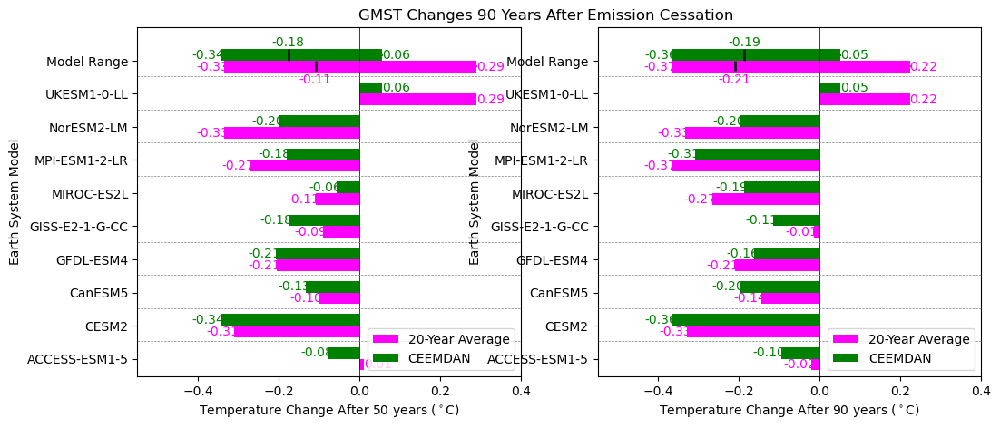

In [243]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

plot_temperature_change(zec50_smean_da.model.values, zec50_smean_da.values, imf50_anom_da.values, 
                        c1='magenta', c2='green', ax=ax1, fig=fig)


plot_temperature_change(zec90_smean_da.model.values, zec90_smean_da.values, imf90_anom_da.values, 
                        c1='magenta', c2='green', year_num='90', ax=ax2, fig=fig)

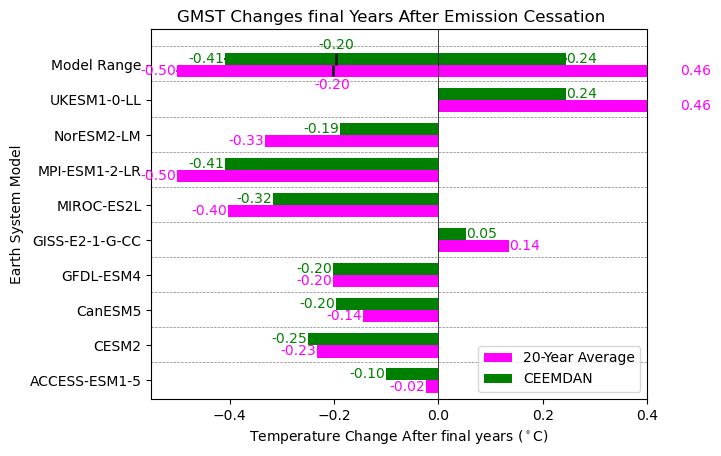

In [244]:
plot_temperature_change(zecfinal_smean_da.model.values, zecfinal_smean_da.values, imffinal_anom_da.values, 
                        c1='magenta', c2='green', year_num='final')


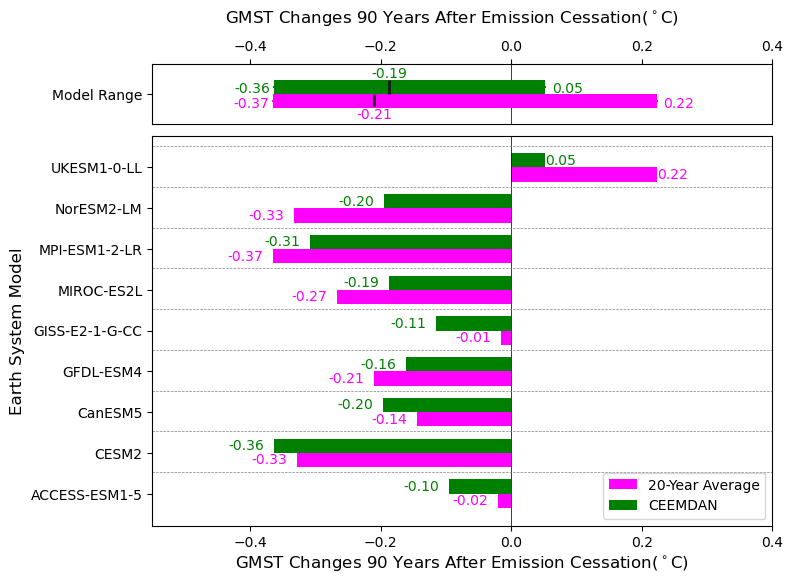

In [245]:
plot_temperature_change_v2(zec90_smean_da.model.values, zec90_smean_da.values, imf90_anom_da.values, 
                        c1='magenta', c2='green', year_num='90')


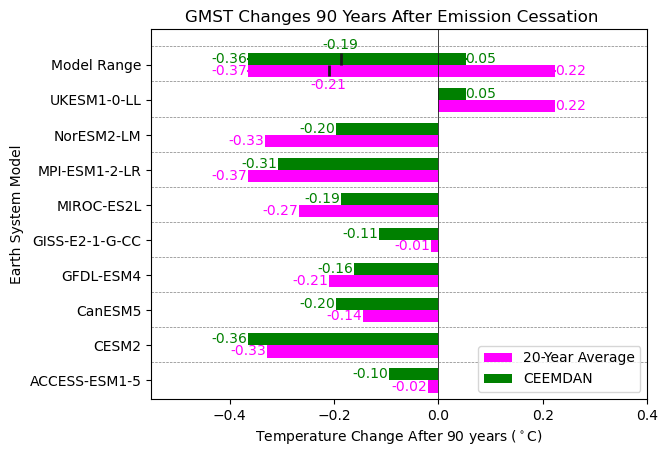

In [246]:
plot_temperature_change(zec90_smean_da.model.values, zec90_smean_da.values, imf90_anom_da.values, 
                        c1='magenta', c2='green', year_num='90')


In [247]:
(a1_full_smean_data-potential_series_data)(np.var).to_pandas().round(3)

,values
model,
ACCESS-ESM1-5,0.013
CESM2,0.010
CanESM5,0.008
GFDL-ESM4,0.011
GISS-E2-1-G-CC,0.020
MIROC-ES2L,0.025
MPI-ESM1-2-LR,0.012
NorESM2-LM,0.022
UKESM1-0-LL,0.010


In [248]:
print(imf_wavelength_df)

   ACCESS-ESM1-5         CESM2       CanESM5     GFDL-ESM4  GISS-E2-1-G-CC  \
0       3.682324      2.945691      3.487272      3.771555        3.776148   
1       8.472229      7.040732      9.055563      9.043640        7.718169   
2      16.807354     13.841956     25.094076     28.193371       15.992451   
3      30.006701     41.083296  14184.878585     65.527480       45.950993   
4   28179.718760  12403.910429           NaN  34415.564793      179.547646   
5            NaN           NaN           NaN           NaN   110537.318877   

     MIROC-ES2L  MPI-ESM1-2-LR    NorESM2-LM   UKESM1-0-LL  
0      4.523740       3.781700      3.883684      3.638504  
1      9.228683       8.409927      8.889261      7.995221  
2     22.895530      18.745937     19.846320     21.325293  
3     63.143035      61.182875     52.595291     55.339661  
4  20654.001748   12583.763843  98560.168993    119.044495  
5           NaN            NaN           NaN  46875.693464  


In [249]:
imf_wavelength_df.round(1)

,ACCESS-ESM1-5,CESM2,CanESM5,GFDL-ESM4,GISS-E2-1-G-CC,MIROC-ES2L,MPI-ESM1-2-LR,NorESM2-LM,UKESM1-0-LL
0,3.7,2.9,3.5,3.8,3.8,4.5,3.8,3.9,3.6
1,8.5,7.0,9.1,9.0,7.7,9.2,8.4,8.9,8.0
2,16.8,13.8,25.1,28.2,16.0,22.9,18.7,19.8,21.3
3,30.0,41.1,14184.9,65.5,46.0,63.1,61.2,52.6,55.3
4,28179.7,12403.9,NaN,34415.6,179.5,20654.0,12583.8,98560.2,119.0
5,NaN,NaN,NaN,NaN,110537.3,NaN,NaN,NaN,46875.7


In [250]:
print(imf_var_df.round(3))

     ACCESS-ESM1-5  CESM2  CanESM5  GFDL-ESM4  GISS-E2-1-G-CC  MIROC-ES2L  \
imf                                                                         
0            0.005  0.005    0.004      0.006           0.016       0.022   
1            0.003  0.003    0.003      0.002           0.003       0.002   
2            0.001  0.001    0.002      0.003           0.001       0.001   
3            0.003  0.001    0.005      0.001           0.001       0.001   
4            0.001  0.014      NaN      0.002           0.006       0.013   
5              NaN    NaN      NaN        NaN           0.000         NaN   

     MPI-ESM1-2-LR  NorESM2-LM  UKESM1-0-LL  
imf                                          
0            0.008       0.019        0.005  
1            0.003       0.002        0.003  
2            0.001       0.001        0.002  
3            0.001       0.005        0.001  
4            0.013       0.000        0.001  
5              NaN         NaN        0.003  


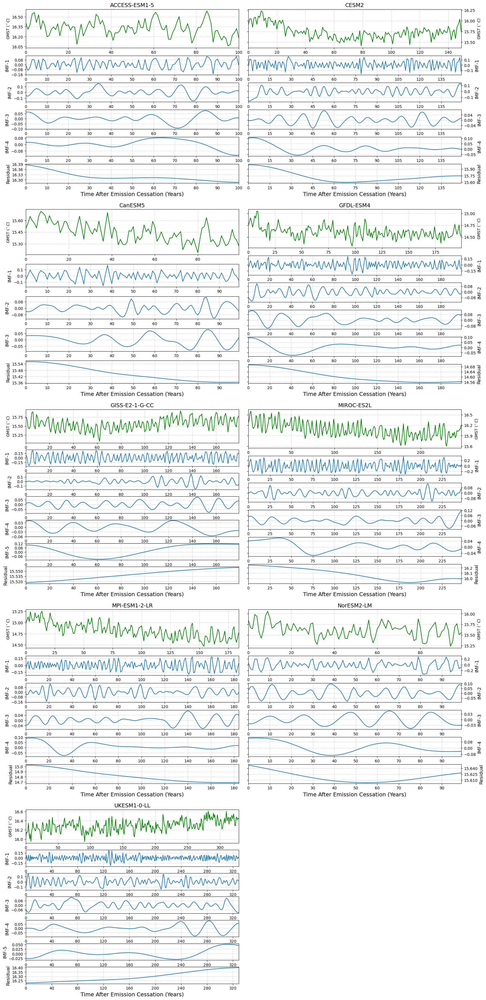

In [251]:
models = imf_data.model

ncols = 2
nrows = int(np.ceil(len(models) / ncols))

fig = plt.figure(figsize=(10 * ncols, 9 * nrows))
gs_outer = gridspec.GridSpec(nrows, ncols, hspace=.15, wspace=.045)

for num, model in enumerate(models):
    
    imf_model_da = imf_data[model]
    num_imfs = len(imf_model_da.imf)

    time_years = np.arange(a1_full_smean_data[model].time.shape[0])

    # Create GridSpec for inner plots (a1 plot + IMFs)
    gs_inner = gridspec.GridSpecFromSubplotSpec(
        num_imfs + 1, 1, subplot_spec=gs_outer[num],
        height_ratios=[1] + [.5] * num_imfs, hspace=0.35)

    # Create the a1 plot
    ax_a1 = fig.add_axes(gs_inner[0].get_position(fig))
    ax_a1.plot(time_years, a1_full_smean_data[model].squeeze().values, color='green')
    ax_a1.set_ylabel(r'GMST ($^\circ C$)' )
    ax_a1.set_title(model, fontsize=14)
    ax_a1.set_xlim(np.take(time_years, [0, -1]))
    ax_a1.yaxis.set_major_locator(MaxNLocator(4))
    ax_a1.grid(True, linestyle='--', alpha=.6)

    # Create IMF plots
    for i, imf in enumerate(imf_model_da.imf.values):
        ax_imf = fig.add_axes(gs_inner[i + 1].get_position(fig))
        ax_imf.plot(time_years, imf_model_da.squeeze().sel(imf=imf).values)


        ax_imf.set_xlim(np.take(time_years, [0, -1]))
        ax_imf.set_ylabel(f'IMF-{imf + 1}' if imf < num_imfs-1 else 'Residual', fontsize=12)

        ax_imf.xaxis.set_major_locator(MaxNLocator(10))
        ax_imf.yaxis.set_major_locator(MaxNLocator(4))
        
        ax_imf.grid(True, linestyle='--', alpha=.6)
        if num%2:
            ax_imf.yaxis.tick_right()
            ax_imf.spines['right'].set_position(('outward', 0))  # Move it outward by 0 points
            ax_imf.yaxis.set_ticks_position('both')  # Ticks on both left and right sides
            ax_imf.yaxis.set_tick_params(which='both', labelright=True)
            ax_imf.yaxis.set_label_position("right")

    if num%2:
        ax_a1.yaxis.tick_right()
        ax_a1.spines['right'].set_position(('outward', 0))  # Move it outward by 0 points
        ax_a1.yaxis.set_ticks_position('both')  # Ticks on both left and right sides
        ax_a1.yaxis.set_tick_params(which='both', labelright=True)
        ax_a1.yaxis.set_label_position("right")
        
    ax_imf.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)

# fig.savefig('/g/data/w40/ab2313/tmp/all_model_ceemdan.png', dpi=1000)

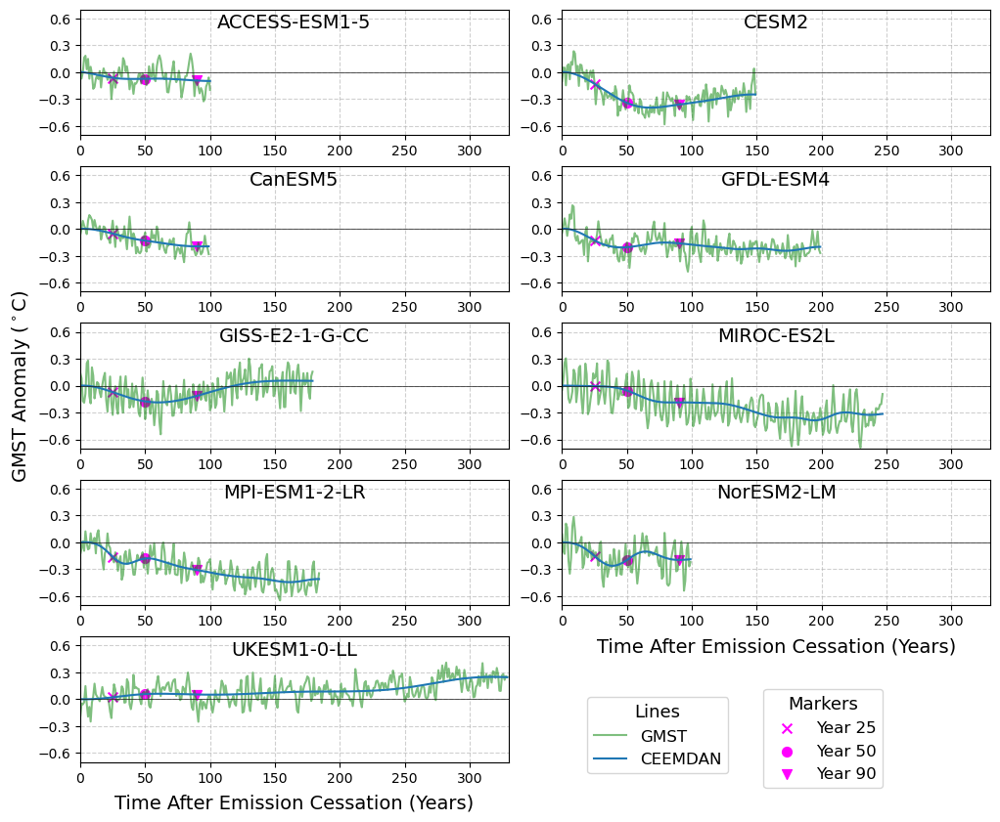

In [252]:
models = pct_smean_data.model

ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.25, wspace=0.125)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    ax = axes[num]
    time = np.arange(a1_full_smean_data[model].time.shape[0])
    a1_raw_vals = a1_full_smean_data[model].squeeze().values
    potential_series_vals = potential_series_data[model].squeeze().values
    a1_raw_vals = a1_raw_vals - potential_series_vals[0]
    potential_series_vals = potential_series_vals - potential_series_vals[0]
    
    # Plot the data for each model
    ax.plot(time, a1_raw_vals , color='green', label='GMST', alpha=0.5)
    ax.plot(time, potential_series_vals, label='CEEMDAN')
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_title('')
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))

    ax.scatter(25, potential_series_vals[25], label='Year 25', s=50, marker='x', color='magenta')
    ax.scatter(50, potential_series_vals[50], label='Year 50', s=50, color='magenta')
    ax.scatter(90, potential_series_vals[90], label='Year 90', s=50, marker='v', color='magenta')

    if num == int(len(models)/2):  axes[num].set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
    else:  ax.set_ylabel('')

    ax.set_xlim(0, 330)

    ax.set_ylim(-0.7, 0.7)
    ax.axhline(0, color='k', linewidth=.5)

# Get legend handles and labels
handles, labels = axes[-1].get_legend_handles_labels()

# Split handles and labels: first two are lines, last three are markers
line_handles = handles[:2]
line_labels = labels[:2]
marker_handles = handles[2:]
marker_labels = labels[2:]

# Add the first legend for lines with a title
legend1 = fig.legend(line_handles, line_labels, loc='lower left', bbox_to_anchor=(0.55, 0.09), 
                     fontsize=12, title="Lines", title_fontsize='13')

# Add the second legend for markers with a title, positioned next to the first one
legend2 = fig.legend(marker_handles, marker_labels, loc='lower left', bbox_to_anchor=(0.7, 0.075), 
                     fontsize=12, title="Markers", title_fontsize='13')


# Labeling x-axis for specific subplots
for ax_num in [-1, -2]:
    ax = axes[ax_num]
    ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', 
                  fontsize=14, labelpad=20 if ax_num < 0 else 12)


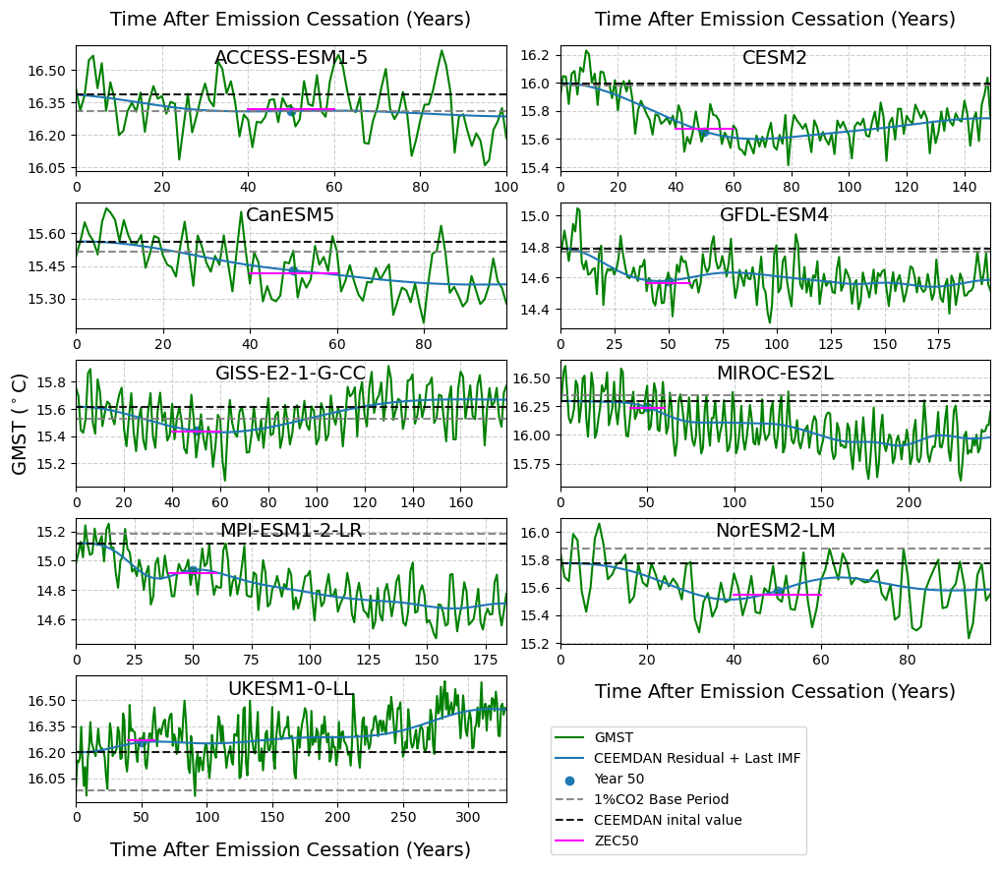

In [253]:
models = pct_smean_data.model

ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.25, wspace=0.125)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    ax = axes[num]
    time = np.arange(a1_full_smean_data[model].time.shape[0])
    a1_raw_vals = a1_full_smean_data[model].squeeze().values
    potential_series_vals = potential_series_data[model].squeeze().values
    
    # Plot the data for each model
    ax.plot(time, a1_raw_vals , color='green', label='GMST')
    ax.plot(time, potential_series_vals, label='CEEMDAN Residual + Last IMF')
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_title('')
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))

    ax.scatter(50, potential_series_vals[50], label='Year 50')

    base_period_mean = np.mean(branch_point_mean_smean_data[model].squeeze().values)
    ax.axhline(base_period_mean, linestyle='--', color='grey', alpha=0.9, label='1%CO2 Base Period')
    ax.axhline(potential_series_vals[0], linestyle='--', color='black', alpha=0.9, label='CEEMDAN inital value')

    ax.plot([40, 60], np.tile(np.mean(a1_raw_vals[40:60]), 2), color='magenta', label='ZEC50')

    if num == int(len(models)/2):  axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    else:  ax.set_ylabel('')

    ax.set_xlim(np.take(time, [0, -1]))

    if num in [0, 1]: 
        axes[num].xaxis.set_label_position('top')

# Add a legend in the lower left hand corner
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(0.75, 0.05))

# Labeling x-axis for specific subplots
for ax_num in [0, 1, -1, -2]:
    ax = axes[ax_num]
    ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', 
                  fontsize=14, labelpad=25 if ax_num < 0 else 12)


<h1 stye='color:yellow'>Local EMD </h1>

## Anomaly Calculations

In [152]:
branch_point_data = pct_data(
    zec_calculation_functions.isolate_base_period,
    a1_data, logginglevel='INFO')

- <function isolate_base_period at 0x14e3ee230940> has been called
- ACCESS-ESM1-5


In [153]:
branch_point_mean_data = pct_data(
    zec_calculation_functions.calculate_branch_average,
    a1_data, logginglevel='INFO')

- <function calculate_branch_average at 0x14e3ee2309d0> has been called
- ACCESS-ESM1-5


In [154]:
branch_point_anom_data = branch_point_data - branch_point_mean_data

In [155]:
# Amomaly time series from the branch point (previosuly called 'experiment_zec_da_anom')
a1_anom_data = (a1_data - branch_point_mean_data)#.compute()

In [156]:
# These two can be computed as they are small (combined is around  100mb with each 
# model being around 7mb
a1_anom_data = a1_anom_data.compute()
pct_data = pct_data.compute()

In [157]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_data = a1_anom_data.isel(time=slice(15, 35)).mean(dim='time').compute()
zec50_data = a1_anom_data.isel(time=slice(40, 60)).mean(dim='time').compute()
zec90_data = a1_anom_data.isel(time=slice(80, 100)).mean(dim='time').compute()
zec50_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144})
MIROC-ES2L     (dataArray): ({'model': 1, 'lat': 64, 'lon': 128})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'lat': 96, 'lon': 192})
NorESM2-LM     (dataArray): ({'model': 1, 'lat': 96, 'lon': 144})
UKESM1-0-LL    (dataArray): ({'model': 1, 'lat': 144, 'lon': 192})

In [158]:
a1_anom_data = a1_anom_data.chunk(chunks_model_based)

In [159]:
a1_anom_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192, 'time': 101})
              (Array: 10.73, Chunk: 1.33Mib) ({'model': (1,), 'lat': (36, 36, 36, 36, 1), 'lon': (96, 96), 'time': (101,)})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288, 'time': 150})
              (Array: 31.64, Chunk: 0.99Mib) ({'model': (1,), 'lat': (36, 36, 36, 36, 36, 12), 'lon': (48, 48, 48, 48, 48, 48), 'time': (150,)})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 100})
              (Array: 3.12, Chunk: 0.2Mib) ({'model': (1,), 'lat': (16, 16, 16, 16), 'lon': (32, 32, 32, 32), 'time': (100,)})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288, 'time': 200})
              (Array: 39.55, Chunk: 1.65Mib) ({'model': (1,), 'lat': (60, 60, 60), 'lon': (36, 36, 36, 36, 36, 36, 36, 36), 'time': (200,)})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144, 'time': 180})
              (Array: 8.90, Ch

## All Grid Cells

In [160]:
client.close()
client = Client(memory_limit=None, threads_per_worker=1, n_workers=200)
client

- Closing Nanny at 'tcp://127.0.0.1:44389'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:44983'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:35951'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:38729'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:39827'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:40869'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:38683'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:36105'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:46787'. Reason: nanny-close
- Nanny 

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 200
Total threads: 200,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:43355,Workers: 200
Dashboard: /proxy/8787/status,Total threads: 200
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:35403,Total threads: 1
Dashboard: /proxy/34903/status,Memory: 0 B
Nanny: tcp://127.0.0.1:41501,


- Event loop was unresponsive in Nanny for 4.12s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.15s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.16s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.16s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.17s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.17s.  This is often caused by long-runni

In [161]:
ceedman = CEEMDAN()

In [162]:
def calculate_CEEMDAN_local(signal):

    # Perform the decomposition
    IMFs = ceedman(signal)

    # Get the last two IMFs
    res = IMFs[-1]
    last_imf = IMFs[-2]

    # Stack them along a new axis (0) to create an array of shape (2, time)
    return last_imf + res

In [163]:
def calculate_CEEMDAN_local_with_filter(signal):
    # print(signal.shape)
    # Perform the decomposition
    IMFs = ceedman(signal)

    # Get the last two IMFs
    res = IMFs[-1]
    imfs = IMFs[:-1]
    time = np.arange(len(res))
    filtered_imfs = filter_imf_arr_hilbert(imfs, time) #filter_imf_arr

    series = res + np.sum(filtered_imfs, axis=0)

    return series

In [164]:
chunks_model_based_tiny = {
    'ACCESS-ESM1-5': {'time': -1, 'lat': 145//5, 'lon': 192//32},   # 5 * 16 = 80
    'CESM2': {'time': -1, 'lat': 144//6, 'lon': 192//32},           # 6 * 14 = 84
    'CanESM5': {'time': -1, 'lat': 60//2, 'lon': 128//16},           # 2 * 8 = 64
    'GFDL-ESM4': {'time': -1, 'lat': 180//18, 'lon': 144//12},        # 6 * 9 = 54
    'GISS-E2-1-G-CC': {'time': -1, 'lat': 90//9, 'lon': 192//8},    # 3 * 8 = 72
    'MIROC-ES2L': {'time': -1, 'lat': 64//16, 'lon': 128//8},        # 4 * 8 = 32
    'MPI-ESM1-2-LR': {'time': -1, 'lat': 96//8, 'lon': 192//16},    # 4 * 16 = 64
    'NorESM2-LM': {'time': -1, 'lat': 96//8, 'lon': 144//9},        # 4 * 9 = 36
    'UKESM1-0-LL': {'time': -1, 'lat': 144//16, 'lon': 192//14},     # 6 * 14 = 84
}
chunks_model_based_tiny

{'ACCESS-ESM1-5': {'time': -1, 'lat': 29, 'lon': 6},
 'CESM2': {'time': -1, 'lat': 24, 'lon': 6},
 'CanESM5': {'time': -1, 'lat': 30, 'lon': 8},
 'GFDL-ESM4': {'time': -1, 'lat': 10, 'lon': 12},
 'GISS-E2-1-G-CC': {'time': -1, 'lat': 10, 'lon': 24},
 'MIROC-ES2L': {'time': -1, 'lat': 4, 'lon': 16},
 'MPI-ESM1-2-LR': {'time': -1, 'lat': 12, 'lon': 12},
 'NorESM2-LM': {'time': -1, 'lat': 12, 'lon': 16},
 'UKESM1-0-LL': {'time': -1, 'lat': 9, 'lon': 13}}

In [165]:
# chunks_model_based_tiny = {
#     'ACCESS-ESM1-5': {'time': -1, 'lat': 145//5, 'lon': 192//16},   # 5 * 16 = 80
#     'CESM2': {'time': -1, 'lat': 144//6, 'lon': 192//14},           # 6 * 14 = 84
#     'CanESM5': {'time': -1, 'lat': 60//2, 'lon': 128//8},           # 2 * 8 = 64
#     'GFDL-ESM4': {'time': -1, 'lat': 180//6, 'lon': 144//9},        # 6 * 9 = 54
#     'GISS-E2-1-G-CC': {'time': -1, 'lat': 90//3, 'lon': 192//8},    # 3 * 8 = 72
#     'MIROC-ES2L': {'time': -1, 'lat': 64//4, 'lon': 128//8},        # 4 * 8 = 32
#     'MPI-ESM1-2-LR': {'time': -1, 'lat': 96//4, 'lon': 192//16},    # 4 * 16 = 64
#     'NorESM2-LM': {'time': -1, 'lat': 96//4, 'lon': 144//9},        # 4 * 9 = 36
#     'UKESM1-0-LL': {'time': -1, 'lat': 144//6, 'lon': 192//14},     # 6 * 14 = 84
# }
# chunks_model_based_tiny


### Local Lowess

In [166]:
import statsmodels.api as sm 
lowess = sm.nonparametric.lowess

In [167]:
a1_full_data = a1_full_data.astype(np.float16).compute().chunk(chunks_model_based_tiny)

In [168]:
def calculate_lowess(arr, window:int=41):
    time = np.arange(len(arr))
    frac =  window/len(arr)
    lowess_fitted = lowess(arr, time, frac=frac, return_sorted=False)
    return lowess_fitted

In [169]:
print( a1_full_data[0])

<xarray.DataArray 'tas' (model: 1, lat: 145, lon: 192, time: 101)> Size: 6MB
dask.array<chunksize=(1, 29, 6, 101), meta=np.ndarray>
Coordinates:
  * lat       (lat) float64 1kB -90.0 -88.75 -87.5 -86.25 ... 87.5 88.75 90.0
  * lon       (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * model     (model) <U13 52B 'ACCESS-ESM1-5'
    ensemble  <U8 32B 'r1i1p1f1'
  * time      (time) object 808B 0168-12-31 00:00:00 ... 0268-12-31 00:00:00


In [170]:
test_local_lowess = xr.apply_ufunc(
    calculate_lowess, 
    a1_full_data[0], 
    input_core_dims=[['time']],
    output_core_dims=[['time']],
    dask='parallelized',
    vectorize=True,
    output_dtypes=[float],    
    kwargs={'window':81}
)

In [171]:
test_local_lowess = test_local_lowess.compute()

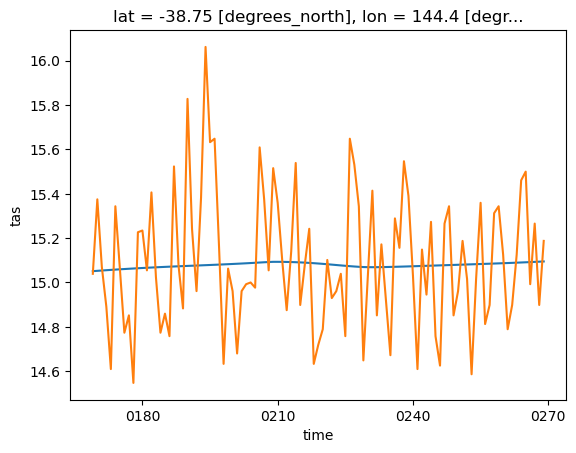

In [172]:
test_local_lowess.sel(lat=-39, lon=145, method='nearest').plot()
a1_full_data[0].sel(lat=-39, lon=145, method='nearest').plot()

In [173]:
local_lowess_list = []

for model in a1_full_data.model:
    print(model)
    local_lowess_model = xr.apply_ufunc(
        calculate_lowess, 
        a1_full_data[model], 
        input_core_dims=[['time']],
        output_core_dims=[['time']],
        dask='parallelized',
        vectorize=True,
        output_dtypes=[float],    
        kwargs={'window':81}
    ).compute()
    local_lowess_list.append(local_lowess_model)

ACCESS-ESM1-5
CESM2
CanESM5
GFDL-ESM4
GISS-E2-1-G-CC
MIROC-ES2L
MPI-ESM1-2-LR
NorESM2-LM
UKESM1-0-LL


In [174]:
local_lowess_data = listXarray(local_lowess_list, 'model')
local_lowess_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'lat': 96, 'lon': 192, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'lat': 96, 'lon': 144, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'lat': 144, 'lon': 192, 'time': 330})

In [175]:
local_lowess_50_data = local_lowess_data.isel(time=50) - local_lowess_data.isel(time=0)

In [176]:
local_lowess_90_data = local_lowess_data.isel(time=50) - local_lowess_data.isel(time=0)

### All Models - Plotting

Note, the code for the plotting comes after the calculation. But, easier ton do this way around so I don't have to comment things out.

In [177]:
# client.cluster.scale(12)

In [178]:
from listXarray import read_listxarray

In [255]:
OPEN_DIR = '/g/data/w40/ab2313/zecmip_new_temp_estimation/a1_local_ceemdan_t3'

In [256]:
local_emd_data = read_listxarray(OPEN_DIR).to_dataarray('tas')

In [257]:
local_emd_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'lat': 96, 'lon': 192, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'lat': 96, 'lon': 144, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'lat': 144, 'lon': 192, 'time': 330})

In [258]:
local_emd_50 = local_emd_data.isel(time=50) - local_emd_data.isel(time=0)

In [259]:
local_emd_90 = local_emd_data.isel(time=90) - local_emd_data.isel(time=0)

In [260]:
temp_levels = np.arange(-2, 2.25, .25)

In [261]:
local_lowess_50_data = local_lowess_50_data.compute()
local_emd_50 = local_emd_50.compute()
zec50_data = zec50_data.compute()
# local_lowess_50_data = local_lowess_50_data.compute()

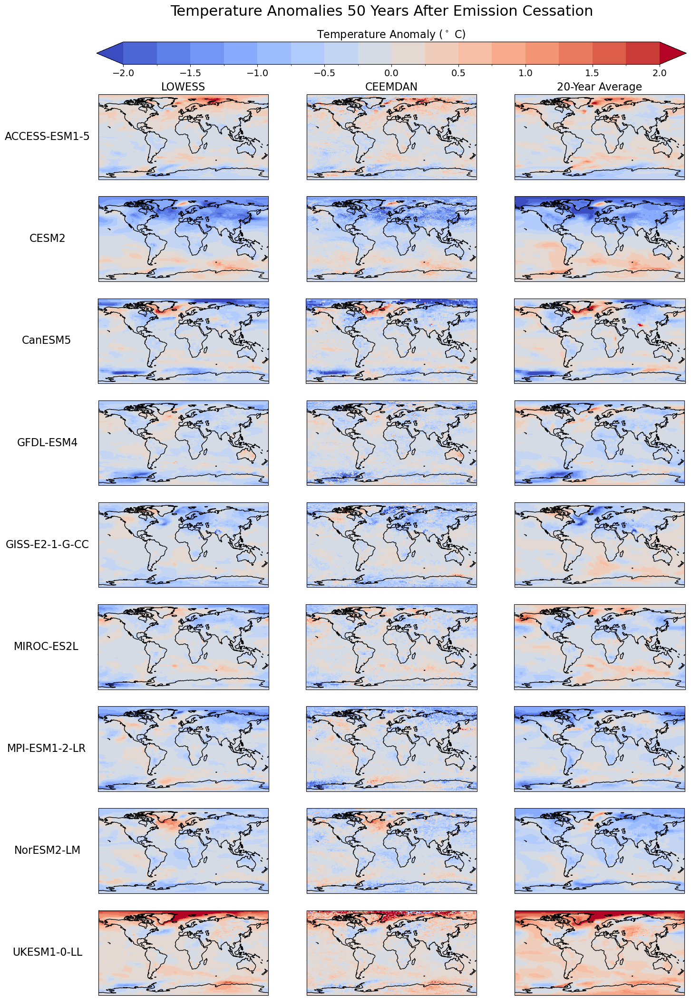

In [313]:
fig = plt.figure(figsize=(16, 26))

outer_gs = gridspec.GridSpec(2, 1, height_ratios = [0.025, 1], hspace=0.065)

# gridspec.GridSpec(10, 3, height_ratios=[0.2] + [1]* 9)

gs = gridspec.GridSpecFromSubplotSpec(9, 3, subplot_spec = outer_gs[1])
upper_gs = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer_gs[0])

for row, model in enumerate(local_emd_50.model):
    # row =row+1
    ax0 = fig.add_subplot(gs[row, 0], projection=ccrs.PlateCarree())
    ax1 = fig.add_subplot(gs[row, 1], projection=ccrs.PlateCarree())
    ax2 = fig.add_subplot(gs[row, 2], projection=ccrs.PlateCarree())
    axes = [ax0, ax1, ax2]

    contour_kwargs = dict(add_colorbar=False, levels=temp_levels, extend='both', cmap='coolwarm')
    contour = local_lowess_50_data[model].plot(ax=ax0, **contour_kwargs)
    local_emd_50[model].plot(ax=ax1, **contour_kwargs)
    zec50_data[model].plot(ax=ax2, **contour_kwargs)
    
    for ax in axes: ax.coastlines()


    if row == 0:
        ax0.set_title('LOWESS', fontsize=16)
        ax1.set_title('CEEMDAN', fontsize=16)
        ax2.set_title('20-Year Average', fontsize=16)
    else:
        for ax in axes: ax.set_title('')
    ax0.annotate(model, xy=(-0.3, 0.5), size=16, xycoords='axes fraction', ha='center', va='center')

fig.suptitle('Temperature Anomalies 50 Years After Emission Cessation', fontsize=22, y=0.91)

cax = plt.subplot(upper_gs[0])
cbar = plt.colorbar(contour, cax=cax, orientation='horizontal')
cbar.ax.set_title('Temperature Anomaly ('+r'$^\circ$ C)', fontsize=16)
cbar.ax.tick_params(labelsize=14)

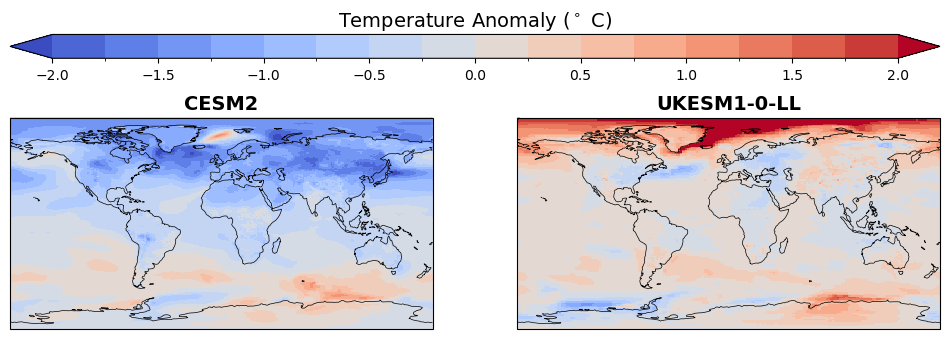

In [263]:

model_subset = ['CESM2', 'UKESM1-0-LL']
fig = plt.figure(figsize=(12, 4))

# Set up gridspec with space for titles and clean spacing
gs = gridspec.GridSpec(2, 2, height_ratios=[0.1, 1], hspace=0.35)

for num, model in enumerate(model_subset):
    ax0 = fig.add_subplot(gs[1, num], projection=ccrs.PlateCarree())


    # Plot data with clean and clear settings
    contour_kwargs = dict(add_colorbar=False, levels=temp_levels, extend='both', cmap='coolwarm')
    contour = local_lowess_50_data[model].plot(ax=ax0, **contour_kwargs)
    
    # Add fine coastlines for clarity without overpowering
    ax0.coastlines(linewidth=0.5)
    
    # Reduce number of grid lines for cleaner look
    
    # Model titles with appropriate size and placement
    ax0.set_title(model, fontsize=14, weight='bold')

# Colorbar at the top for balance and clean title
cax = plt.subplot(gs[0, :])
cbar = plt.colorbar(contour, cax=cax, orientation='horizontal')
cbar.ax.set_title('Temperature Anomaly ('+r'$^\circ$ C)', fontsize=14)

# Tight layout to ensure spacing looks great
plt.tight_layout()
plt.show()


In [264]:
fontscale = 1.3

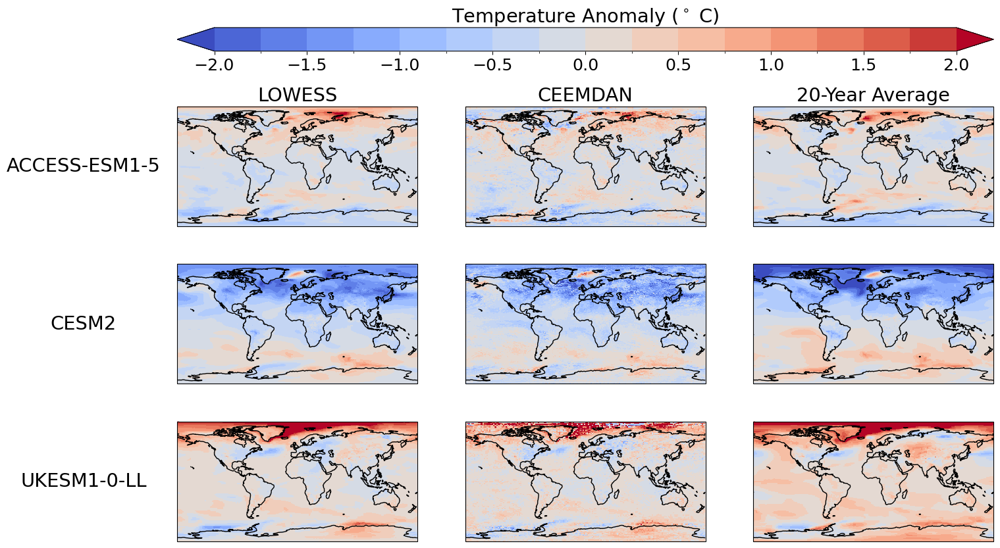

In [265]:
model_list = ['ACCESS-ESM1-5', 'CESM2', 'UKESM1-0-LL']
nrows = len(model_list)

fig = plt.figure(figsize=(16, 3.5*nrows))

outer_gs = gridspec.GridSpec(2, 1, hspace=.15, height_ratios=[0.05, 1])

inner_gs1 = gridspec.GridSpecFromSubplotSpec(len(model_list), 3, subplot_spec=outer_gs[1], hspace=.01)

# gs = gridspec.GridSpec(nrows+1, 3, height_ratios=[0.2] + [1]* nrows, hspace=0.25)

for row, model in enumerate(model_list):
    # row =row+1
    ax0 = fig.add_subplot(inner_gs1[row, 0], projection=ccrs.PlateCarree())
    ax1 = fig.add_subplot(inner_gs1[row, 1], projection=ccrs.PlateCarree())
    ax2 = fig.add_subplot(inner_gs1[row, 2], projection=ccrs.PlateCarree())
    axes = [ax0, ax1, ax2]

    contour_kwargs = dict(add_colorbar=False, levels=temp_levels, extend='both', cmap='coolwarm')
    contour = local_lowess_50_data[model].plot(ax=ax0, **contour_kwargs)
    local_emd_50[model].plot(ax=ax1, **contour_kwargs)
    zec50_data[model].plot(ax=ax2, **contour_kwargs)
    
    for ax in axes: ax.coastlines()


    if row == 0:
        ax0.set_title('LOWESS', fontsize=16*fontscale)
        ax1.set_title('CEEMDAN', fontsize=16*fontscale)
        ax2.set_title('20-Year Average', fontsize=16*fontscale)
    else:
        for ax in axes: ax.set_title('')
    ax0.annotate(model, xy=(-0.3*fontscale, 0.5), size=16*fontscale, xycoords='axes fraction', ha='center', va='center')

# fig.suptitle('Temperature Anomalies 50 Years After Emission Cessation', fontsize=22, y=0.91)

cax = plt.subplot(outer_gs[0, :])
cbar = plt.colorbar(contour, cax=cax, orientation='horizontal')
cbar.ax.set_title('Temperature Anomaly ('+r'$^\circ$ C)', fontsize=16*fontscale)
cbar.ax.tick_params(labelsize=14*fontscale)

In [266]:

def regrid_datasets(local_data, target_model_name, method='nearest_s2d'):
    import xesmf

    # Drop ensemble and model dimensions from the target dataset
    target_ds = local_data[target_model_name].drop(['ensemble', 'model'], errors='ignore')
    
    regridded_file_list = []
    
    # Iterate through all models in the dataset
    for model in local_data.model:
        print(f"Processing model: {model}")
        
        if target_model_name not in model:
            ds_to_regrid = local_data[model].drop(['ensemble', 'model'], errors='ignore')
            
            # Create a regridder for the current model
            regridder = xesmf.Regridder(ds_to_regrid, target_ds, method=method)
            
            # Perform the regridding
            regridded_file = regridder(ds_to_regrid).squeeze('model')
            regridded_file = regridded_file.expand_dims(model=[model])
        else:
            # If the model is the target model, use it directly
            regridded_file = local_data[model]
        
        regridded_file_list.append(regridded_file)
    
    # Combine all regridded files into a single xarray dataset
    return listXarray(regridded_file_list, key_dim='model')

In [267]:
zec50_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144})
MIROC-ES2L     (dataArray): ({'model': 1, 'lat': 64, 'lon': 128})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'lat': 96, 'lon': 192})
NorESM2-LM     (dataArray): ({'model': 1, 'lat': 96, 'lon': 144})
UKESM1-0-LL    (dataArray): ({'model': 1, 'lat': 144, 'lon': 192})

In [268]:
zec50_data_regrid = regrid_datasets(zec50_data, target_model_name='MPI-ESM1-2-LR')
zec50_data_regrid_da = zec50_data_regrid.concat('model')

Processing model: ACCESS-ESM1-5


--------------------------------------------------------------------------
but there are no active ports detected (or Open MPI was unable to use
them).  This is most certainly not what you wanted.  Check your
cables, subnet manager configuration, etc.  The openib BTL will be
ignored for this job.

  Local host: gadi-cpu-spr-0704
--------------------------------------------------------------------------


Processing model: CESM2
Processing model: CanESM5
Processing model: GFDL-ESM4
Processing model: GISS-E2-1-G-CC
Processing model: MIROC-ES2L
Processing model: MPI-ESM1-2-LR
Processing model: NorESM2-LM
Processing model: UKESM1-0-LL


In [269]:
local_lowess_50_data_regrid = regrid_datasets(local_lowess_50_data, target_model_name='MPI-ESM1-2-LR')
local_lowess_50_data_regrid_da = local_lowess_50_data_regrid.concat('model')

Processing model: ACCESS-ESM1-5
Processing model: CESM2
Processing model: CanESM5
Processing model: GFDL-ESM4
Processing model: GISS-E2-1-G-CC
Processing model: MIROC-ES2L
Processing model: MPI-ESM1-2-LR
Processing model: NorESM2-LM
Processing model: UKESM1-0-LL


In [270]:
local_emd_50_regrid = regrid_datasets(local_emd_50, target_model_name='MPI-ESM1-2-LR')
local_emd_50_regrid_da = local_emd_50_regrid.concat('model')

Processing model: ACCESS-ESM1-5
Processing model: CESM2
Processing model: CanESM5
Processing model: GFDL-ESM4
Processing model: GISS-E2-1-G-CC
Processing model: MIROC-ES2L
Processing model: MPI-ESM1-2-LR
Processing model: NorESM2-LM
Processing model: UKESM1-0-LL


In [271]:
np.diff(local_emd_50['MPI-ESM1-2-LR'].lon.values)

array([1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88,
       1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.88, 1.

In [272]:
np.diff(local_emd_50['MPI-ESM1-2-LR'].lat.values)

array([1.85, 1.86, 1.86, 1.86, 1.86, 1.86, 1.86, 1.86, 1.87, 1.87, 1.87,
       1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87,
       1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87,
       1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87,
       1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87,
       1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87,
       1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87,
       1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.87, 1.86,
       1.86, 1.86, 1.86, 1.86, 1.86, 1.86, 1.85])

In [273]:
local_emd_50_regrid_cooling = xr.where(local_emd_50_regrid_da<0, 1, 0)
local_emd_50_regrid_warming= xr.where(local_emd_50_regrid_da>0, 1, 0)

In [274]:
local_lowess_50_regrid_cooling = xr.where(local_lowess_50_data_regrid_da<0, 1, 0)
local_lowess_50_regrid_warming= xr.where(local_lowess_50_data_regrid_da>0, 1, 0)

In [275]:
zec50_data_regrid_da_cooling = xr.where(zec50_data_regrid_da<0, 1, 0)
zec50_data_regrid_da_warming = xr.where(zec50_data_regrid_da>0, 1, 0)

In [276]:
local_emd_50_regrid_cooling

<xarray.DataArray (model: 9, lat: 96, lon: 192)> Size: 1MB
1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 ... 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1
Coordinates:
  * model     (model) object 72B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * lat       (lat) float64 768B -88.57 -86.72 -84.86 ... 84.86 86.72 88.57
  * lon       (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
    ensemble  <U8 32B 'r1i1p1f1'

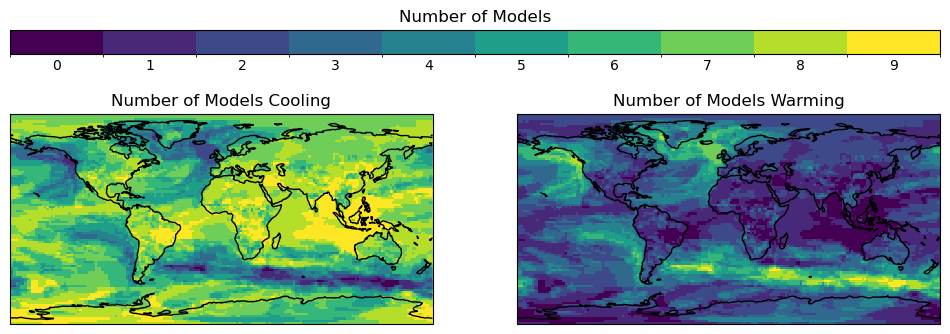

In [277]:
fig = plt.figure(figsize=(12, 4))

# Set up gridspec with space for titles and clean spacing
gs = gridspec.GridSpec(2, 2, height_ratios=[0.1, 1], hspace=0.35)



ax1 = fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree())
ax2 = fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree())


axes = [ax1, ax2]

number_kwargs = dict(levels=np.arange(0, 11), cmap='viridis', add_colorbar=False, alpha=1)

local_lowess_50_regrid_cooling.sum(dim='model').plot(ax=ax1, **number_kwargs)
plot = local_lowess_50_regrid_warming.sum(dim='model').plot(ax=ax2, **number_kwargs)




ax1.set_title('Number of Models Cooling')
ax2.set_title('Number of Models Warming')



for ax in axes: ax.coastlines()

cax = plt.subplot(gs[0, :])
# Adjusting colorbar settings for centered ticks without extra lines
cbar = plt.colorbar(plot, cax=cax, orientation='horizontal', drawedges=False)
cbar.ax.set_title('Number of Models')

# Set ticks to be centered in each color segment
cbar.set_ticks(np.arange(0.5, 10.5, 1))
cbar.set_ticklabels(np.arange(0, 10, 1))
cbar.ax.tick_params(size=0, length=0, color='none')

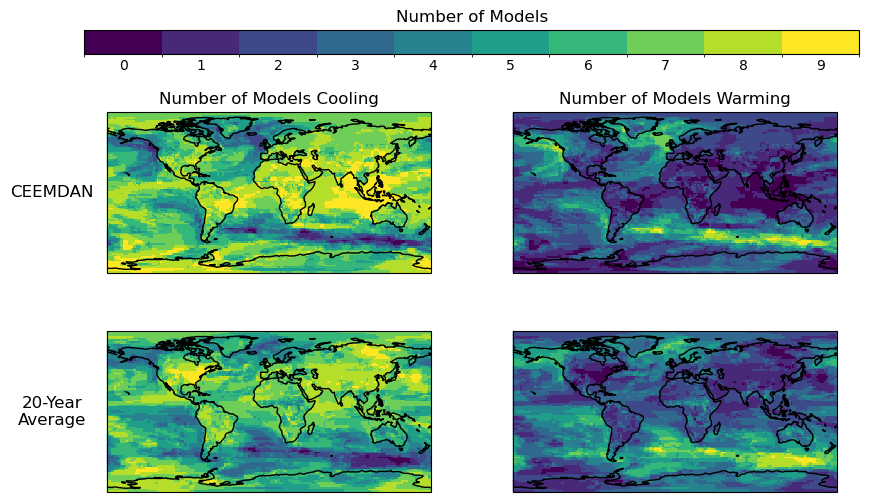

In [278]:
fig = plt.figure(figsize=(10, 6))
gs = gridspec.GridSpec(3, 2, height_ratios=[0.15] + 2* [1], hspace=0.5, wspace=0.1)

ax1 = fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree())
ax2 = fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree())
ax3 = fig.add_subplot(gs[2, 0], projection=ccrs.PlateCarree())
ax4 = fig.add_subplot(gs[2, 1], projection=ccrs.PlateCarree())

axes = [ax1, ax2, ax3, ax4]

number_kwargs = dict(levels=np.arange(0, 11), cmap='viridis', add_colorbar=False, alpha=1)

local_lowess_50_regrid_cooling.sum(dim='model').plot(ax=ax1, **number_kwargs)
plot = local_lowess_50_regrid_warming.sum(dim='model').plot(ax=ax2, **number_kwargs)

zec50_data_regrid_da_cooling.sum(dim='model').plot(ax=ax3, **number_kwargs)
zec50_data_regrid_da_warming.sum(dim='model').plot(ax=ax4, **number_kwargs)



ax1.set_title('Number of Models Cooling')
ax2.set_title('Number of Models Warming')
ax3.set_title('')
ax4.set_title('')


ax1.annotate('CEEMDAN', xy=(-0.17, 0.5), size=12, xycoords='axes fraction', ha='center', va='center')
ax3.annotate('20-Year\nAverage', xy=(-0.17, 0.5), size=12, xycoords='axes fraction', ha='center', va='center')

for ax in axes: ax.coastlines()

cax = plt.subplot(gs[0, :])
# Adjusting colorbar settings for centered ticks without extra lines
cbar = plt.colorbar(plot, cax=cax, orientation='horizontal', drawedges=False)
cbar.ax.set_title('Number of Models')

# Set ticks to be centered in each color segment
cbar.set_ticks(np.arange(0.5, 10.5, 1))
cbar.set_ticklabels(np.arange(0, 10, 1))
cbar.ax.tick_params(size=0, length=0, color='none')

### All Models CEEMDAN - Calculation

In [211]:
# client.close()
# client = Client(memory_limit=None, threads_per_worker=1, n_workers=200)
# client

- Closing Nanny at 'tcp://127.0.0.1:39161'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:36999'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:36055'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:43517'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:36501'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:46401'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:32821'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:42231'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:35851'. Reason: nanny-close
- Nanny 

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 200
Total threads: 200,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39309,Workers: 200
Dashboard: /proxy/8787/status,Total threads: 200
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:41977,Total threads: 1
Dashboard: /proxy/36025/status,Memory: 0 B
Nanny: tcp://127.0.0.1:39149,


- Event loop was unresponsive in Nanny for 4.70s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.71s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.71s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.71s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.71s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.71s.  This is often caused by long-runni

In [212]:
a1_full_data = a1_full_data.astype(np.float16).compute().chunk(chunks_model_based_tiny)

In [213]:
a1_full_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192, 'time': 101})
              (Array: 5.36, Chunk: 0.03Mib) ({'model': (1,), 'lat': (29, 29, 29, 29, 29), 'lon': (6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6), 'time': (101,)})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288, 'time': 150})
              (Array: 15.82, Chunk: 0.04Mib) ({'model': (1,), 'lat': (24, 24, 24, 24, 24, 24, 24, 24), 'lon': (6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6), 'time': (150,)})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 100})
              (Array: 1.56, Chunk: 0.05Mib) ({'model': (1,), 'lat': (30, 30, 4), 'lon': (8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8), 'time': (100,)})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288, 'time': 200})
      

In [214]:
SAVE_DIR = '/g/data/w40/ab2313/zecmip_new_temp_estimation/a1_local_ceemdan_t3'

In [217]:
os.makedirs(SAVE_DIR, exist_ok=True)

In [ ]:
os.listdir(SAVE_DIR)

In [ ]:
for model in a1_full_data.model[1:]:
    t1 = time_it()
    print(model)
    
    local_imf_da = xr.apply_ufunc(
        calculate_CEEMDAN_local_with_filter,
        a1_full_data[model],
        input_core_dims=[['time']],
        output_core_dims=[['time']],  
        dask='parallelized',
        vectorize=True,
        output_dtypes=[float])

    local_imf_da = local_imf_da.compute()
    print(' - calculation complete')


    local_imf_da.to_netcdf(os.path.join(SAVE_DIR, model+'.nc'))
    time_taken = (time_it() - t1)/60
    print(f'saving complete ({time_taken=}minutes)')

CESM2


In [ ]:
# local_imf_da = xr.apply_ufunc(
#     calculate_CEEMDAN_local_with_filter,
#     a1_full_data[model],
#     input_core_dims=[['time']],
#     output_core_dims=[['time']],  
#     vectorize=True,
#     dask='parallelized',
#     output_dtypes=[float])

In [ ]:
# local_imf_da = local_imf_da.compute()

### Single Model Example

In [ ]:
# a1_full_data = a1_full_data.transpose(*['model','lat', 'lon', 'time'])
# a1_full_data = a1_full_data.compute()

In [ ]:
d1 = a1_full_data[0].squeeze().compute().chunk(chunks_model_based_tiny['UKESM1-0-LL'])

In [ ]:
# d1 = d1.transpose('lat', 'lon', 'time')

In [ ]:
dask.visualize(d1)

In [ ]:
d1

In [ ]:
local_imf_da = xr.apply_ufunc(
    calculate_CEEMDAN_local,
    d1,
    # a1_full_data[0].isel(lat=slice(0,5), lon=slice(0,5)).squeeze(),
    input_core_dims=[['time']],
    output_core_dims=[['imf', 'time']],  # The 'imf' dimension comes first
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float],  # Only one output dtype since both outputs are merged
    # dask_gufunc_kwargs={'output_sizes': {'imf': 2}}  # Define the size of the 'imf' dimension
)#.compute()
# local_imf_da = local_imf_da.transpose( 'lat', 'lon', 'imf', 'time')

In [ ]:
local_imf_da = local_imf_da.compute()

In [ ]:
local_imf_da.isel(lat=0, lon=0).sum(dim='imf').plot()
a1_full_data[0].isel(lat=0, lon=0).plot()

<h1 style='color: cyan'> Demonstration Plots </h1>

In [71]:
models = pct_smean_data.model
models

array(['ACCESS-ESM1-5', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC',
       'MIROC-ES2L', 'MPI-ESM1-2-LR', 'NorESM2-LM', 'UKESM1-0-LL'],
      dtype='<U14')

In [73]:
def plot_raw_a1_vals(ax, model, t_length=60):
    time = np.arange(t_length)
    
    ax.plot(time, a1_smean_data.sel(model=model).isel(time=slice(0,t_length)).squeeze().values, linewidth=2)
    zec50_val = a1_smean_data.sel(model=model).isel(time=slice(40,60)).squeeze().mean().values
    ax.plot([40, 60], [zec50_val, zec50_val], color='orange', linewidth=2)
    ax.scatter([50], zec50_val, s=50, color='orange', linewidth=2)
    
    ax.axhline(branch_point_smean_data.sel(model=model).mean().values.item(),
               color='magenta', linestyle='--', alpha=0.5, zorder=-10, linewidth=2)
    
    ax.set_title(model, fontsize=16)

    ax.set_ylabel(r'GMST ($\circ$c)', fontsize=16)
    ax.set_xlabel('Time After EMission Cessation (Years)', fontsize=16)
    ax.tick_params(axis='both', size=6, labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.3, color='grey')
    ax.set_xlim(0, t_length)



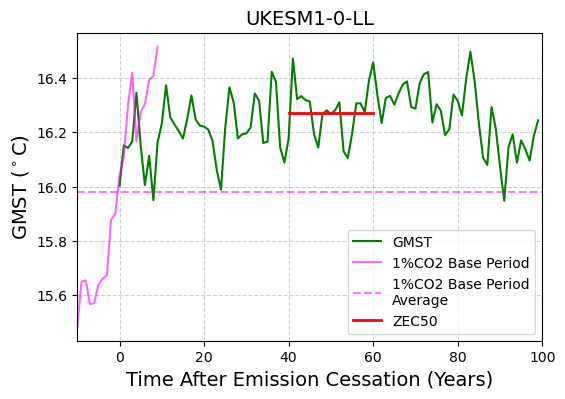

In [305]:
# Select the model you want to visualize
model = pct_smean_data.model[-1]  # You can change this index to select different models

# Create a single figure and axis for one model
fig, ax = plt.subplots(figsize=(6, 4))
time_lim = 100

# Time data for the selected model
time = np.arange(a1_full_smean_data[model].time.shape[0])[:time_lim]

branch_time = np.arange(-10, 10)
a1_raw_vals = a1_full_smean_data[model].squeeze().values[:time_lim]
potential_series_vals = potential_series_data[model].squeeze().values[:time_lim]

# Plot the data for the selected model
ax.plot(time, a1_raw_vals, color='green', label='GMST')
ax.grid(True, linestyle='--', alpha=0.6)
ax.set_title(model, fontsize=14)

# Annotate specific points and add reference lines
base_period_mean = np.mean(branch_point_mean_smean_data[model].squeeze().values)
ax.plot(branch_time, branch_point_smean_data[model].squeeze().values, label='1%CO2 Base Period', 
       color='magenta', alpha=0.6)

ax.axhline(base_period_mean, linestyle='--', color='magenta', alpha=0.55, label='1%CO2 Base Period\nAverage')
ax.plot([40, 60], np.tile(np.mean(a1_raw_vals[40:60]), 2), color='red', label='ZEC50', linewidth=2)

# Set labels
ax.set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
ax.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)

# Set the x-axis limits
ax.set_xlim(-10, time_lim)

# Add a legend in the lower right-hand corner
ax.legend(loc='best')
# ax.legend(loc='center right', bbox_to_anchor=[1.5, 0.5])

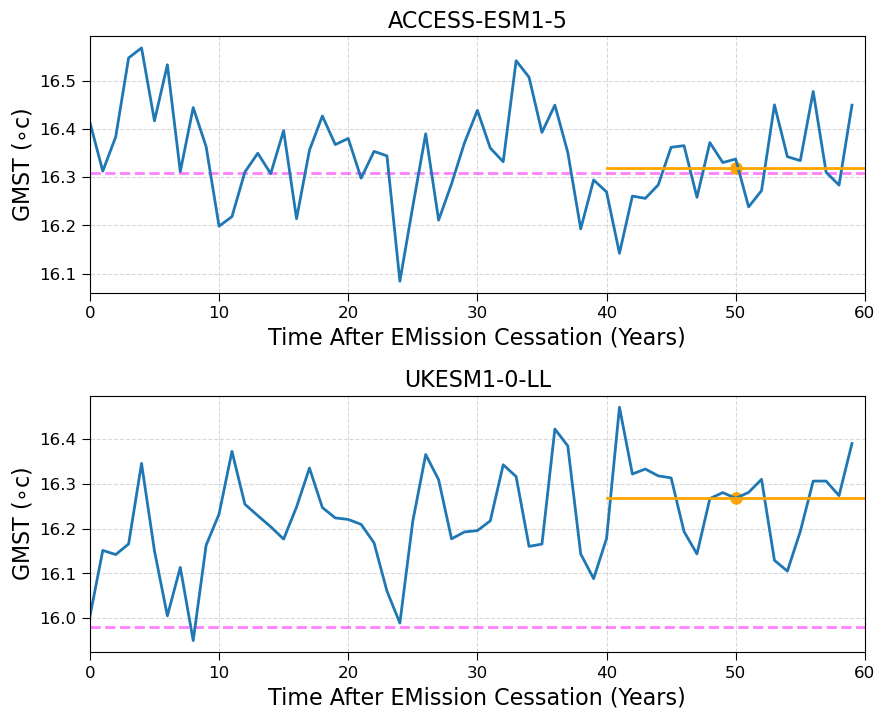

In [74]:
fig = plt.figure(figsize=(10, 8))
gs = gridspec.GridSpec(2, 1, hspace=0.4)
axes = [fig.add_subplot(gs[i]) for i in range(2)]

plot_raw_a1_vals(axes[0], 'ACCESS-ESM1-5')
plot_raw_a1_vals(axes[1], 'UKESM1-0-LL')

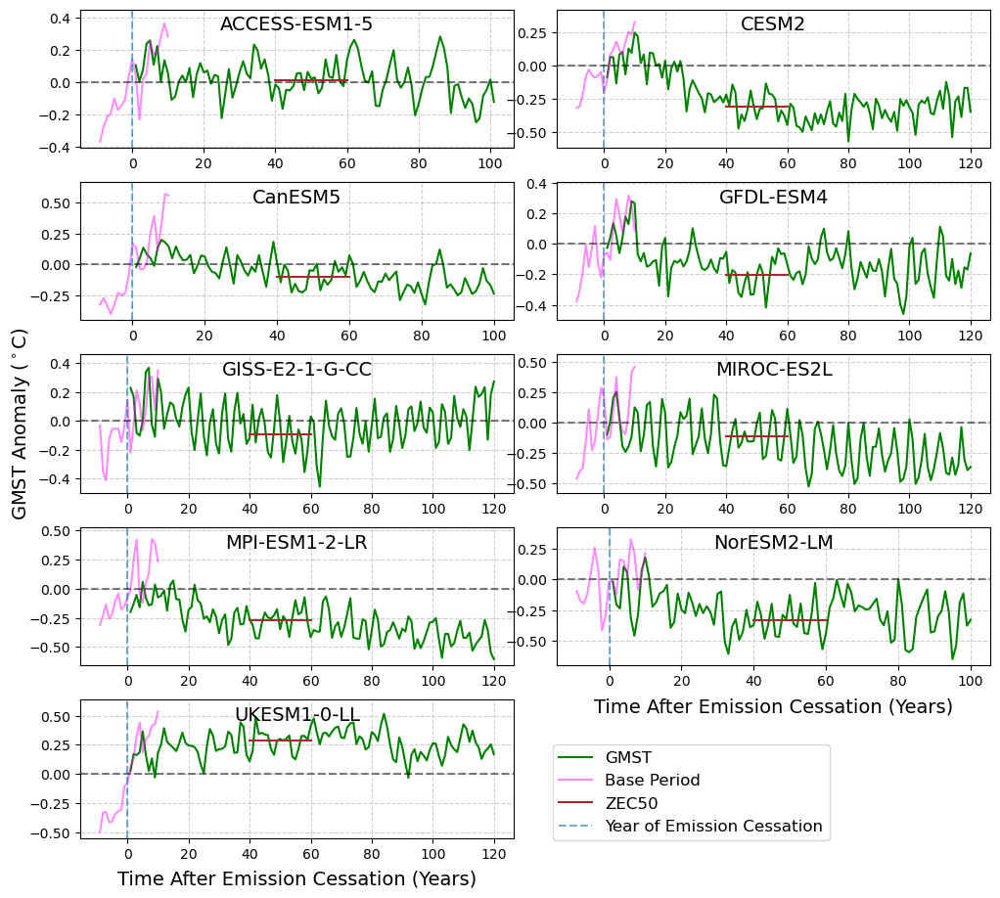

In [75]:

ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2.2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.25, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(len(models))]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    ax = axes[num]
    a1_smean_anom_t0_da.sel(model=model).isel(time=slice(0, 120)).plot(ax=ax, color='green', label='GMST')

    branch_point_smean_anom_t0_da.sel(model=model).plot(ax=ax, color='magenta', label='Base Period', 
                                                       alpha=0.45)
    
    # zec50_model_val = zec25_smean_da.sel(model=model).squeeze().values.item()
    zec50_model_val = a1_smean_anom_t0_da.sel(model=model).isel(time=slice(40, 60)).mean().values.item()

    
    ax.plot([40, 60], np.tile(zec50_model_val,2),  color='brown', label='ZEC50')
    
    ax.grid(True, linestyle='--', alpha=0.6)

    ax.set_title('')


    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
    else:
         ax.set_ylabel('')

    # if num in [0, 1]:
    #     axes[num].xaxis.set_label_position('top')
    #     axes[num].xaxis.tick_top()

    ax.axvline(0, label='Year of Emission Cessation', linestyle='--', alpha=0.6)
    ax.axhline(0, linestyle='--', color='k', alpha=0.5)#, label='Base Period Averg')
    # plotting_functions.add_figure_label2(ax, f'{chr(97+num)})', y=.87)
    ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[-1]+0.05)
    ax.set_xlabel('')
   

# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
# leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(0.77, 0.1), fontsize=12)

# Add x-axis label to the last subplot

for ax_num in [-1, -2]:
    ax = axes[ax_num]
    ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', 
                  fontsize=14, labelpad=20 if ax_num<0 else 12)

# axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
# axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

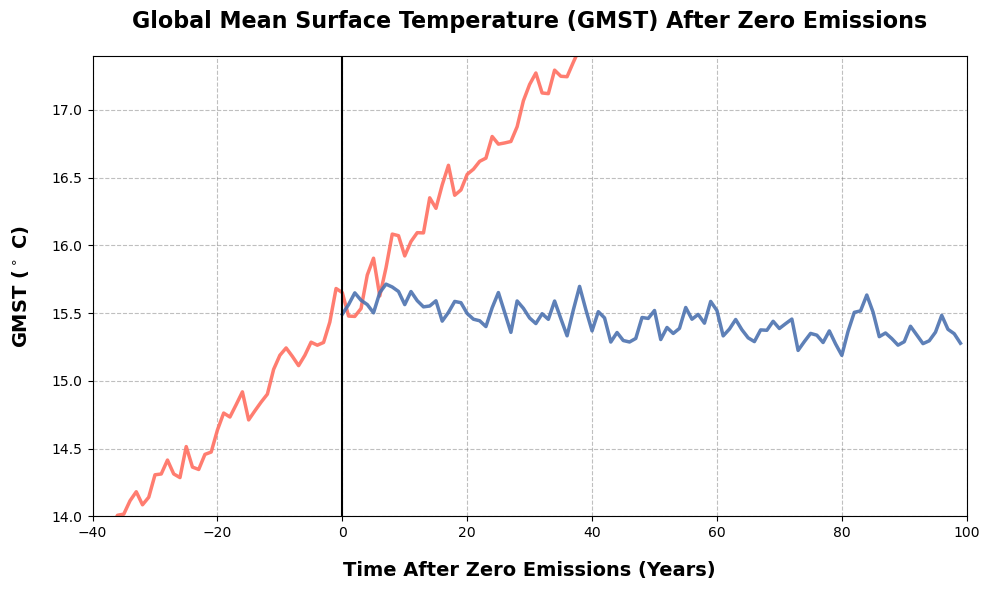

In [76]:
imodel = 2
model = pct_smean_data.model[imodel]
fig, ax = plt.subplots(figsize=(10, 6))  # Larger figure for better visibility

# Time axis adjustments
a1_time = a1_data[model].time.dt.year.values
a1_0 = a1_time[0]
a1_time = a1_time - a1_0
pct_time = pct_smean_data[model].time.dt.year.values - a1_0

# Plot data with improved color scheme and thicker lines
ax.plot(pct_time, pct_smean_data[model].squeeze().values, color='#FF6F61', label='PCT Mean', linewidth=2.5, alpha=0.9)
ax.plot(a1_time, a1_smean_data[model].squeeze().values, color='#4C72B0', label='A1 Mean', linewidth=2.5, alpha=0.9)

# Add grid with subtle appearance
ax.grid(True, linestyle='--', color='grey', alpha=0.5)

# Set limits for y and x axes
ax.set_ylim(14, 17.4)
ax.set_xlim(-40, 100)

# Add a vertical line to mark zero emissions
ax.axvline(0, color='black', linestyle='-', linewidth=1.5)

# Enhance labels with font size, weight, and add some padding
ax.set_ylabel('GMST (' + r'$^\circ$ C)', fontsize=14, fontweight='bold', labelpad=15)
ax.set_xlabel('Time After Zero Emissions (Years)', fontsize=14, fontweight='bold', labelpad=15)

# Improve the legend positioning and aesthetics
# ax.legend(loc='upper left', fontsize=12, frameon=False)

# Add a title to the plot
ax.set_title('Global Mean Surface Temperature (GMST) After Zero Emissions', fontsize=16, fontweight='bold', pad=20)

# Show the enhanced plot
plt.tight_layout()
plt.show()

In [78]:

def plot_zecmip_data(ax, a1_model_subset, pct_model_subset, zec50_anom, zec25_anom):
    branch_year = a1_model_subset.time.values[0].year
    base_period_years =  np.arange(branch_year-10, branch_year+10)
    
    pct_brach_subset = pct_model_subset.sel(
        time=pct_model_subset.time.dt.year.isin(base_period_years))

    a1_time = np.arange(0, len(a1_model_subset.time.values))
    pct_time = np.arange(-10, 10)
    
    base_period_mean = pct_brach_subset.mean(dim='time').values
    
    
    ax.plot(
        a1_time,
        # a1_model_subset.time.values,
        np.tile(base_period_mean, len(a1_model_subset.time.values)),
        linestyle='--', color='k', label='Base Period Average')
    
    ax.plot(pct_time, pct_brach_subset.values, color='magenta', label='Base Period',
           # linestyle='--', marker='o'
           )
    
    ax.plot(a1_time, a1_model_subset.values, color='green', linewidth=2, label='A1')

    #### ZEC50
    zec50_loc = a1_model_subset.isel(time=slice(40, 60)).mean().values
    # zec50_val= zec50_loc
    ax.plot(np.arange(40, 60),
            np.tile(zec50_loc, 20),
            color='blue', linewidth=2)
    if zec50_loc < base_period_mean: ytrans = -0.2
    else: ytrans = 0.2
    ax.annotate(f'{zec50_anom:.2f}', xy=(50,zec50_loc+ytrans), ha='center', color='blue')

    ### ZEC25
    zec25_loc = a1_model_subset.isel(time=slice(15, 35)).mean().values
    # zec50_val= zec50_loc
    ax.plot(np.arange(15, 35),
            np.tile(zec25_loc, 20),
            color='brown', linewidth=2)
    if zec25_loc < base_period_mean: ytrans = -0.2
    else: ytrans = 0.2
    ax.annotate(f'{zec25_anom:.2f}', xy=(25,zec25_loc+ytrans), ha='center', color='brown')
    
    
    ax.axvline(0, label='Branch Point')
    
    ### Styling
    ax.grid(True, linestyle='--', color='grey', alpha=0.5)

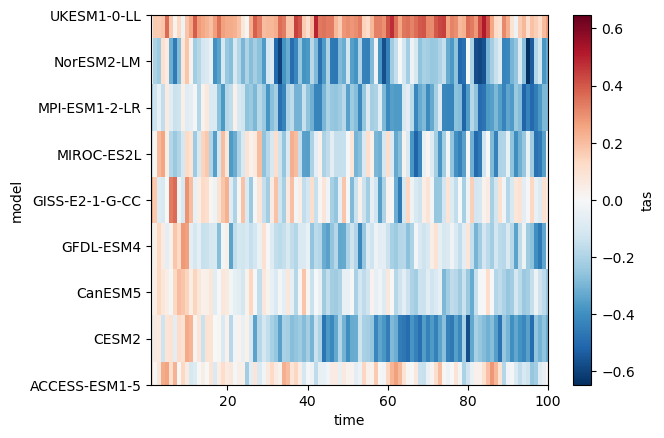

In [79]:
a1_smean_anom_t0_da.isel(time=slice(0, 100)).squeeze().plot()

In [80]:
models = pct_smean_data.model
models

array(['ACCESS-ESM1-5', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC',
       'MIROC-ES2L', 'MPI-ESM1-2-LR', 'NorESM2-LM', 'UKESM1-0-LL'],
      dtype='<U14')

Text(0.5, 0, 'Time After Emission Cessation (Years)')

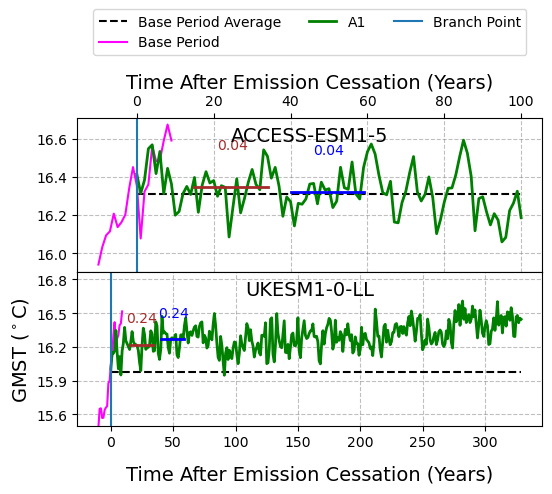

In [81]:
models = ['ACCESS-ESM1-5', 'UKESM1-0-LL']

ncols = 1
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(len(models))]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(models):
    plot_zecmip_data(axes[num], a1_smean_data[model].squeeze(), pct_smean_data[model].squeeze(),
                    zec25_smean_da.sel(model=model).values.item(), zec25_smean_da.sel(model=model).values.item())
    # plot_model_data(axes[num], model, ds_pct, a1_smean_xrlist[model])
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    if model == 'UKESM1-0-LL': axes[num].set_ylim(15.5, 16.87)
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    # Add y-axis label to the middle left subplot
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)

    if num == 0:
        axes[num].xaxis.set_label_position('top')
        axes[num].xaxis.tick_top()
    


# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

# Add x-axis label to the last subplot
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

Text(0.5, 0, 'Time After Emission Cessation (Years)')

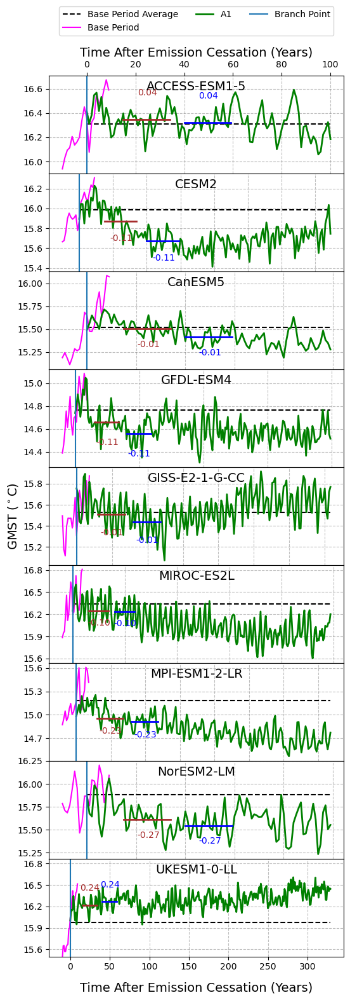

In [82]:
models = pct_smean_data.model

ncols = 1
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(len(models))]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    plot_zecmip_data(axes[num], a1_smean_data[model].squeeze(), pct_smean_data[model].squeeze(),
                    zec25_smean_da.sel(model=model).values.item(), zec25_smean_da.sel(model=model).values.item())
    # plot_model_data(axes[num], model, ds_pct, a1_smean_xrlist[model])
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    if model == 'UKESM1-0-LL': axes[num].set_ylim(15.5, 16.87)
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    # Add y-axis label to the middle left subplot
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)

    if num == 0:
        axes[num].xaxis.set_label_position('top')
        axes[num].xaxis.tick_top()
    


# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

# Add x-axis label to the last subplot
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

Text(0.5, 0, 'Time After Emission Cessation (Years)')

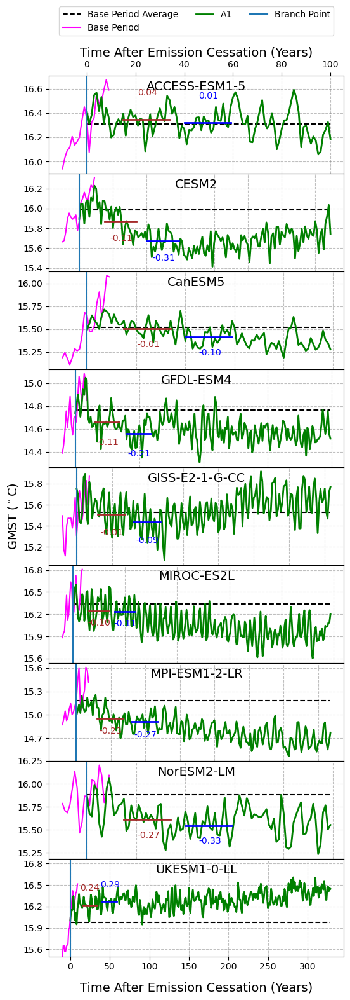

In [83]:
# ncols = 2
# nrows = int(np.ceil(len(models)/ncols))

# fig = plt.figure(figsize=(6*ncols, 2*nrows))
# gs = gridspec.GridSpec(nrows, ncols, hspace=0.2, wspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(9)]

ncols = 1
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.refkeys):
    plot_zecmip_data(axes[num], a1_smean_data[model].squeeze(), pct_smean_data[model].squeeze(),
                    zec50_smean_da.sel(model=model).values.item(), zec25_smean_da.sel(model=model).values.item())
    # plot_model_data(axes[num], model, ds_pct, a1_smean_xrlist[model])
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    if model == 'UKESM1-0-LL': axes[num].set_ylim(15.5, 16.87)
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    # Add y-axis label to the middle left subplot
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)

    if num == 0:
        axes[num].xaxis.set_label_position('top')
        axes[num].xaxis.tick_top()
    


# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

# Add x-axis label to the last subplot
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

Text(0.5, 0, 'Time After Emission Cessation (Years)')

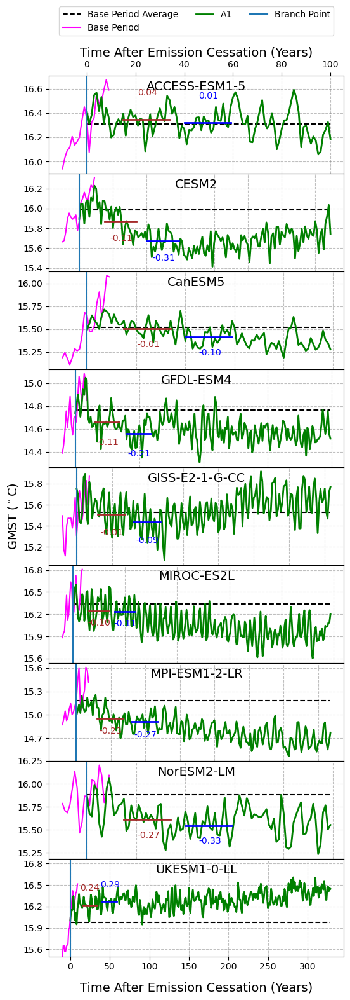

In [84]:
# ncols = 2
# nrows = int(np.ceil(len(models)/ncols))

# fig = plt.figure(figsize=(6*ncols, 2*nrows))
# gs = gridspec.GridSpec(nrows, ncols, hspace=0.2, wspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(9)]

ncols = 1
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.refkeys):
    plot_zecmip_data(axes[num], a1_smean_data[model].squeeze(), pct_smean_data[model].squeeze(),
                    zec50_smean_da.sel(model=model).values.item(), zec25_smean_da.sel(model=model).values.item())
    # plot_model_data(axes[num], model, ds_pct, a1_smean_xrlist[model])
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    if model == 'UKESM1-0-LL': axes[num].set_ylim(15.5, 16.87)
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    # Add y-axis label to the middle left subplot
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)

    if num == 0:
        axes[num].xaxis.set_label_position('top')
        axes[num].xaxis.tick_top()
    


# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

# Add x-axis label to the last subplot
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

<h1 style='color: cyan'> Pi-Control CEEMDAN </h1>

In [309]:
# pi-Control (not ESM)
esmpi_raw_data = (open_zecmip.extract_experiment_into_xrlist('picontrol', 'tas', chunks=chunks, logginglevel='INFO')
                    .to_dataarray('tas')
                    .isel(ensemble=0)
                    .squeeze('ensemble')
                    .sort_by_refkey()
                    .rename({'latitude':'lat', 'longitude': 'lon'}))

- ACCESS-ESM1-5
-      r1i1p1f1 - /g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316/*.nc
- CanESM5
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r1i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p2f1/Amon/tas/gn/v20190429/*.nc
- MIROC-ES2L
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MIROC/MIROC-ES2L/piControl/r1i1p1f2/Amon/tas/gn/v20190823/*.nc
- UKESM1-0-LL
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MOHC/UKESM1-0-LL/piControl/r1i1p1f2/Amon/tas/gn/v20200828/*.nc
- MPI-ESM1-2-LR
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r1i1p1f1/Amon/tas/gn/v20190710/*.nc
-      r2i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r2i1p1f1/Amon/tas/gn/v20190815/*.nc
- GISS-E2-1-G-CC
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/NASA-GISS/GISS-E2-1-G-CC/piControl/r1i1p1f1/Amon/tas/gn/v2

In [189]:
esmpi_raw_data = esmpi_raw_data.isel(ensemble=0)
esmpi_raw_data = esmpi_raw_data - 273.15
esmpi_data = esmpi_raw_data.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
# Can see this in the global mean time series. But this has errors after 1000
esmpi_data['CanESM5'] = esmpi_data['CanESM5'].isel(time=slice(None, 1000))

In [190]:
esmpi_smean_data = esmpi_data(my_stats.space_mean).compute()

2025-01-21 10:10:32,715 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('transpose-cf709cf41716e7b6163d358e7e215bac', 0, 0, 0, 0))" coro=<Worker.execute() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/worker_state_machine.py:3615>> ended with CancelledError
2025-01-21 10:10:32,803 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/worker.py"

In [ ]:
esmpi_smean_data[-1].plot()

In [ ]:
esmpi_smean_data[-1].squeeze()

In [ ]:
ceedman_esmpi_da = calculate_CEEMDAN(esmpi_smean_data.squeeze()[-1])

In [ ]:

n_imfs = len(ceedman_esmpi_da.imf)
n_imfs2 = len(ceedman_data[-1].imf.values)

# Create a figure with GridSpec
fig = plt.figure(figsize=(16, 15))
gs = gridspec.GridSpec(n_imfs + 1, 2, figure=fig)

# Plot original signal (left column)
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(esmpi_smean_data[-1].squeeze().time.values, 
         esmpi_smean_data[-1].squeeze().values)
ax1.set_title("Original Signal")

# Plot IMFs (left column)
for i in range(n_imfs):
    ax = fig.add_subplot(gs[i + 1, 0])
    ax.plot(ceedman_esmpi_da.time.values, ceedman_esmpi_da.squeeze().sel(imf=i), color='green')
    ax.set_title(f"IMF {i + 1}")

# Plot original signal (right column)
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(a1_full_smean_data[-1].squeeze().time.values, 
         a1_full_smean_data[-1].squeeze().values)
ax2.set_title("Original Signal")

# Plot IMFs (right column)
for i in range(n_imfs2):
    ax = fig.add_subplot(gs[i + 1, 1])
    ax.plot(ceedman_data[-1].time.values, ceedman_data[-1].squeeze().sel(imf=i), color='green')
    ax.set_title(f"IMF {i + 1}")

plt.tight_layout()
plt.show()


In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1)

ceedman_data[-1].isel(imf=-2).plot(ax=ax1)
ceedman_esmpi_da.isel(imf=-5).plot(ax=ax1)


ceedman_data[-1].isel(imf=-3).plot(ax=ax2)
ceedman_esmpi_da.isel(imf=-6).plot(ax=ax2)

ax2.grid(True)

In [ ]:

n_imfs = len(ceedman_esmpi_da.imf)
n_imfs2 = len(ceedman_data[-1].imf.values)

esmpi_time = np.arange(len(esmpi_smean_data[-1].squeeze().time.values))
a1_time = np.arange(len(ceedman_data[-1].time.values))

# Create a figure with GridSpec
fig = plt.figure(figsize=(16, 15))
gs = gridspec.GridSpec(n_imfs + 1, 2, figure=fig)

# Plot original signal (left column)
ax1 = fig.add_subplot(gs[0, 0])


ax1.plot(esmpi_time[:320], 
         esmpi_smean_data[-1].squeeze().values[:320])
ax1.set_title("Original Signal")

# Plot IMFs (left column)
for i in range(n_imfs):
    ax = fig.add_subplot(gs[i + 1, 0])
    ax.plot(esmpi_time[:320], ceedman_esmpi_da.squeeze().sel(imf=i).values[:320], color='green')
    ax.set_title(f"IMF {i + 1}")

# Plot original signal (right column)
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(a1_time, 
         a1_full_smean_data[-1].squeeze().values)
ax2.set_title("Original Signal")

# Plot IMFs (right column)
for i in range(n_imfs2):
    ax = fig.add_subplot(gs[i + 1, 1])
    ax.plot(a1_time, ceedman_data[-1].squeeze().sel(imf=i), color='green')
    ax.set_title(f"IMF {i + 1}")

plt.tight_layout()
plt.show()


In [ ]:

n_imfs = len(ceedman_esmpi_da.imf)
n_imfs2 = len(ceedman_data[-1].imf.values)

esmpi_time = np.arange(len(esmpi_smean_data[-1].squeeze().time.values))
a1_time = np.arange(len(ceedman_data[-1].time.values))

# Create a figure with GridSpec
fig = plt.figure(figsize=(16, 15))
gs = gridspec.GridSpec(n_imfs + 1, 2, figure=fig)

# Plot original signal (left column)
ax1 = fig.add_subplot(gs[0, 0])


ax1.plot(esmpi_time, 
         esmpi_smean_data[-1].squeeze().values)
ax1.set_title("Original Signal")

# Plot IMFs (left column)
for i in range(n_imfs):
    ax = fig.add_subplot(gs[i + 1, 0])
    ax.plot(esmpi_time, ceedman_esmpi_da.squeeze().sel(imf=i), color='green')
    ax.set_title(f"IMF {i + 1}")

# Plot original signal (right column)
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(a1_full_smean_data[-1].squeeze().time.values, 
         a1_full_smean_data[-1].squeeze().values)
ax2.set_title("Original Signal")

# Plot IMFs (right column)
for i in range(n_imfs2):
    ax = fig.add_subplot(gs[i + 1, 1])
    ax.plot(a1_time, ceedman_data[-1].squeeze().sel(imf=i), color='green')
    ax.set_title(f"IMF {i + 1}")

plt.tight_layout()
plt.show()
